## Analizador Bioimagenes C. elegans - Conteo diferencial de núcleos fluorescentes

### 1 - Instalar librerias necesarias:

In [ ]:
!pip install bioio 
!pip install bioio_bioformats 
!pip install opencv-python
!pip install matplotlib
!pip install seaborn
!pip install scipy

### 2 - Importar librerias necesarias 

In [32]:
from bioio import BioImage
import openx
import bioio_bioformats
import numpy as np  
import cv2 
import pandas as pd
from scipy import stats as sps
from enum import Enum
import matplotlib.pyplot as plt
import seaborn as sns


ModuleNotFoundError: No module named 'openx'

### 3 - Ejecutar las Clases Necesarias:

In [2]:
class BioImagenDim(Enum):
    _2D = 2
    _3D = 3
    _4D = 4
    _5D = 5
        
class BioImageHandler():
    '''
        Clase para la manipulación y procesamiento de imagenes biológicas de microscopía, en particular, confocal de fluorescencia.
        La imagen según su formato es convertida a una matriz de tipo compatible según escala de grises. Los analisis se realizan particularmente en tipo uint8.
        Se requiere Java para el empleo de bioio_bioformats. 
    '''
    
    def __init__(self, rutaImagen):
        self.rutaImagen = rutaImagen # Nota , algunos formatos pueden requerir tener sus metadatos en la propia carpeta con el mismo nombre.
        self.img = None # Array uni o multidimensional.
        self.imgArrays = None 
        self.imgMatrizActual = None
    
    def leerBioImage_CV2(self):
        # Función para imagenes 2D tipo .png, .jpg y algunos .tiff
        try:
            img = cv2.imread(self.rutaImagen, cv2.IMREAD_GRAYSCALE)
            self.img = img
            return img
        except Exception as e:
            print(f"Error al leer la imagen: {e}")
            return None   
    
    def leerBioImagen_bioformats(self):
        # Funcion que transforma una iamgen cargada por su ruta en su Array multidimensional según si es una pila de imagenes o no. 
        
        try:
            img = BioImage(self.rutaImagen, reader=bioio_bioformats.Reader)
            self.img = img.data
            return img.data
        except Exception as e:
            print(f"Error al leer la imagen: {e}")
            return None
    
    def tipoArrayImagen(self, img = None):
        # Indica el tipo de int del Array que conforma a la imagen
        
        if img is None:
            img = self.img
        
        return type(img) 
    
    def procesar_shape(self, img = None):
        """
            Función para comprobar el shape de una imagen y desempaquetar la tupla adecuadamente.
    
            Argumentos:
            img -- El array de imagen (puede ser de 2D, 3D, o 4D)
    
            Retorna:
            Un diccionario con las dimensiones de la imagen procesada (alto, ancho, canales, cortes_z, fotogramas, etc.)
            
            # Por ejemplo, el formato .ids/.ics contiene 4 imagenes según el canal, de modo que el shape del array es, por ejemplo, (1, 4, 1, 1024, 1024)
            # El primer 1 indica número de pilas de imágenes (o "z-stack"), es deciar, hay una sola imagen por canal, no un conjunto de imágenes apiladas en el eje Z.
            # El 4 , indica la cantidad de canales que son equivalentes a imagenes por canal. 
            # El tercer 1 indica la cantidad de capturadas por canal. 
            # Los 1024 indica la resolución. 
        """
    
        # Obtener el shape de la imagen
        if img is None:
            img = self.img
        
        shape = img.shape
        print(f"Shape de la imagen: {shape}")
        
        # Definir las funciones que manejan cada tipo de shape
        def procesar_2d(shape):
            # Imagen 2D (escala de grises)
            alto, ancho = shape
            return {'alto': alto, 'ancho': ancho, 'canales': 1, 'cortes_z': 1, 'fotogramas': 1}

        def procesar_3d(shape):
            # Imagen 3D (con canales o apilamiento Z)
            alto, ancho, canales = shape
            return {'alto': alto, 'ancho': ancho, 'canales': canales, 'cortes_z': 1, 'fotogramas': 1}
        
        def procesar_3d_grayscale(shape):
            # Imagen en escala de grises con una dimensión extra (ej. un fotograma)
            alto, ancho, _ = shape
            return {'alto': alto, 'ancho': ancho, 'canales': 1, 'cortes_z': 1, 'fotogramas': 1}
        
        def procesar_4d(shape):
            # Imagen 4D (por ejemplo, stack de imágenes o apilamiento con canales)
            cortes_z, canales, alto, ancho = shape
            return {'cortes_z': cortes_z, 'canales': canales, 'alto': alto, 'ancho': ancho, 'fotogramas': 1}
        
        def procesar_5d(shape):
            # Imagen 5D (stack 3D + canales + fotogramas)
            cortes_z, canales, fotogramas, alto, ancho = shape
            return {'cortes_z': cortes_z, 'canales': canales, 'fotogramas': fotogramas, 'alto': alto, 'ancho': ancho}
        
        # Diccionario simulando el "switch case"
        switch = {
            2: procesar_2d,
            3: procesar_3d,
            4: procesar_4d,
            5: procesar_5d
        }

        # Comprobar el número de dimensiones (len(shape))
        if len(shape) == 3 and shape[2] == 1:
            # Si la imagen es 3D pero con un solo canal (escala de grises)
            return procesar_3d_grayscale(shape)
        
        # Si el número de dimensiones está en el diccionario, usamos la función correspondiente
        if len(shape) in switch:
            return switch[len(shape)](shape)
        else:
            # Si no hay función definida para el número de dimensiones, devolver error
            return {'error': 'Dimensiones no soportadas'}
    
    def obtenerImagenesArray(self, img = None):
        # Recibe un tipo Array multidimensional y lo desarma en una lista de Arrays de facil acceso por índice. 
        # Suelen corresponder a los canales del microscopio 
        # Retorna el puntero a dichos arrays y el tipo del mismo.
        
        if img is None:
            img = self.img
        
        imgArrays = img.squeeze() 
        self.imagenesCanales = imgArrays 
        
        return imgArrays, imgArrays.shape 
    
    def convertirImgArray_AMAtriz(self, imgArray):
        # Convierte un array de una imagen de tipo uintx a una matriz del mismo tipo
        
        matriz_imagen = np.array(imgArray)
        max_value = np.iinfo(matriz_imagen.dtype).max
        if matriz_imagen[0, :].all() == max_value:
            matriz_imagen = matriz_imagen[1:, :]
        elif matriz_imagen[0, :].all() == np.max(matriz_imagen):
            matriz:imagen = matriz_imagen[1:, :]
        self.imgMatrizActual = matriz_imagen
        
        return matriz_imagen
    
    def normalizarImgMatriz(self, imgMatriz = None):
        # Normaliza una matriz que representa una imagen. 
        # Nota: Actualiza la matriz guardada en la clase
        
        if imgMatriz is None:
            imgMatriz = self.imgMatrizActual
        
        imgMatriz = imgMatriz.astype(np.uint16)
    
        # Normalizar los valores al rango [0, 1] basado en el rango real de los datos
        matriz_img_norm = imgMatriz / imgMatriz.max()
        self.imgMatrizActual = matriz_img_norm
        
        return matriz_img_norm
    
    def binarizarImgMatrizNorm(self, imgMatriz = None, threshold = 0.5):
        # Dada una matriz normalizada , la binariza (transforma a 0 y 1) dado cierto threshold para la señal. 
        
        if imgMatriz is None:
            imgMatriz = self.imgMatrizActual
        
        imgBinMatriz = imgMatriz
        imgBinMatriz[imgMatriz > threshold] = 1
        imgBinMatriz[imgMatriz <= threshold] = 0
        imgBinMatriz = imgBinMatriz.astype(np.uint8)
        self.imgMatrizActual = imgBinMatriz
        
        return imgBinMatriz

    def rellenar_agujeros_internos(self, matrizLabeleada, kernel=None, max_iter=50):
        """
        Rellena los ceros internos de cada objeto (label > 0)
        sin superponer otros labels.

        matrizLabeleada : np.ndarray
            Matriz de etiquetas con 0 = fondo y >0 = objetos.
        kernel : np.ndarray | None
            Kernel estructural para la expansión (default: elíptico 3x3).
        max_iter : int
            Iteraciones máximas de expansión.

        Retorna
            matriz_rellenada : np.ndarray
                Nueva matriz de etiquetas con agujeros internos rellenados.
        """
        if kernel is None:
            kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))

        matriz_rellenada = matrizLabeleada.copy()

        for label in np.unique(matrizLabeleada):
            if label == 0:
                continue  # ignorar fondo

            mascara_objeto = (matriz_rellenada == label).astype(np.uint8)

            for iteracion in range(max_iter):
                # Dilatar objeto
                objeto_dilatado = cv2.dilate(mascara_objeto, kernel, iterations=1)

                # Candidatos = dilatación - objeto actual
                candidatos = (objeto_dilatado == 1) & (matriz_rellenada == 0)

                if not np.any(candidatos):
                    break  # nada que rellenar

                # Asignar candidatos solo a este objeto
                matriz_rellenada[candidatos] = label
                mascara_objeto = (matriz_rellenada == label).astype(np.uint8)

        return matriz_rellenada

In [3]:
OFFSET = 9

class WormTracker(BioImageHandler):
    '''
        A partir de una imagen de microcopía de campo claro:
        - Segmentación de la imagen según los gusanos presentes.
        - Precondición : Los gusanos deben de tener un contorno con el fondo negro para que la
        segmentación pueda efectuarse correctamente.
        A partir de un canal de fluorescencia de nucleos:
        - Detección y rotulo de los nucleos.
        - Obtención de un diccionario de tuplas (x,y) de sus coordenadas.
        - Determinación de su centroide.
        - Grafico comparativo de recuadros encerrando el núcleo y del centroide
        - Estadística de la fluorescencia de los nucleos en Unidades Arbitrarias de Fluorescencia.
        - Fluorescencia de núcleos por gusanos.
    '''
    
    def __init__(self, rutaImagen, canalActual = None):
        super().__init__(rutaImagen) # Para herencia de BioImageHandler
        self.canalActual = canalActual
        self.imgArray = None
        self.imgProcesadaArray = None
        self.imgFluo = None
        self.imgFluoProc = None
        self.imgCampoClaro = None
        self.imgCampoClaroProc = None
        self.imgGusanosDetectados = None
        self.imgNucleos = None
        self.imgGusanosRellenados = None
        self.num_gusanos = None
        self.num_nucleos = None # Nota: Se debe restar 1 a este valor, puesto que cuenta al fondo como rotulo 0. 
        self.centroidesGusanos = None
        self.centroidesNucleos = None 
        self.coordenadasGusanos = None
        self.coordenadasNucleos = None
        self.coordenadasNucleosPorGusano = None
        self.fluorescenciasPorGusano = None
        self.fluorescenciasPorGusanoOriginal = None
        self.fluorescenciasPorGusanoCorregido = None
        self.figuraGusanos = None
        self.figuraGraficoViolin = None
        
    def procesarImagen(self, tipo=BioImagenDim._3D,
                   canalFluo=1, canalCampoClaro=3,
                   thresholdFluo=0.5, thresholdCampoClaro=0.275):
        """
        Procesa todos los canales de la imagen en paralelo, aplicando distintos
        thresholds según si el canal corresponde a fluorescencia o campo claro.

        Devuelve:
            - imgArray: lista de imágenes originales (por canal).
            - imgProcesadaArray: lista de imágenes procesadas (por canal).
        """

        # Lectura de la imagen
        if tipo == BioImagenDim._2D:
            img = super().leerBioImage_CV2()
        else:
            img = super().leerBioImagen_bioformats()

        if img is None:
            print("No image loaded")
            return None, None

        # Procesar forma
        forma_imagen = super().procesar_shape(img)

        # Extraer arrays de canales
        if forma_imagen["canales"] > 1:
            imgArrays, _ = super().obtenerImagenesArray(img)
        else:
            imgArrays = [img]

        imgProcesadaArray = []

        # Definir configuración de thresholds por tipo de canal
        config_canales = {
            canalFluo: thresholdFluo,
            canalCampoClaro: thresholdCampoClaro
        }

        # Procesar cada canal
        for i, canal_img in enumerate(imgArrays):
            canal_proc = super().convertirImgArray_AMAtriz(canal_img)
            canal_proc = super().normalizarImgMatriz(canal_proc)

            if i in config_canales:
                threshold = config_canales[i]
                canal_proc = super().binarizarImgMatrizNorm(canal_proc, threshold)

            imgProcesadaArray.append(canal_proc)

        # Guardar en atributos
        self.imgArray = imgArrays
        self.imgProcesadaArray = imgProcesadaArray

        # Guardar alias útiles
        if canalCampoClaro < len(imgArrays):
            self.imgCampoClaro = imgArrays[canalCampoClaro]
            self.imgCampoClaroProc = imgProcesadaArray[canalCampoClaro]
        if canalFluo < len(imgArrays):
            self.imgFluo = imgArrays[canalFluo]
            self.imgFluoProc = imgProcesadaArray[canalFluo]

        return imgArrays, imgProcesadaArray

    
    def seleccionarCanal(self, canal=0):
        '''
            Selecciona un canal de la imagen y de la imagen procesada.
            Actualiza:
                - self.imgActual
                - self.imgProcesada
            Retorna: (imgCanal, imgProcesadaCanal)
        '''
        if not hasattr(self, "imgArray") or not hasattr(self, "imgProcesadaArray"):
            print("Debe llamar primero a procesarImagen()")
            return None, None
        
        if canal < 0 or canal >= len(self.imgArray):
            print(f"Canal inválido. Disponible: 0–{len(self.imgArray)-1}")
            return None, None
        
        self.imgActual = self.imgArray[canal]
        self.imgProcesada = self.imgProcesadaArray[canal]
        
        return self.imgActual, self.imgProcesada

    def buscarGusanos(self, imgBinaria = None, tol_cerrada_1 = 1, tol_cerrada_2 = 1,
                    iteraciones = 6, con_rellenado_inundacion = False, min_area = 100,
                    tol_rellenado_1 = 1, tol_rellenado_2 = 2, max_iteracion = 30):

        if imgBinaria is None:
            imgBinaria = self.imgCampoClaroProc

        #  Dimensiones de la imagen
        h, w = imgBinaria.shape

        # 1- Cierre morfológico con kernel pequeño para cerrar agujeros internos
        kernel_cerrado = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (tol_cerrada_1, tol_cerrada_2))
        matriz_bin_cerrada = cv2.morphologyEx(imgBinaria, cv2.MORPH_CLOSE, kernel_cerrado, iterations= iteraciones)
        # Esti hace dilatación seguida de erosión: Para cerrar agujeros pequeños o discontinuidades.

        # 2 - Invertir y rellenar fondo
        if con_rellenado_inundacion:
            img_rellenadoInunacion = matriz_bin_cerrada.copy()
            mascara = np.zeros((h+2, w+2), np.uint8)
            cv2.floodFill(img_rellenadoInunacion, mascara, (0,0), 255)
            img_rellenadoInunacion_inv = cv2.bitwise_not(img_rellenadoInunacion)
            matriz_rellenada = matriz_bin_cerrada | img_rellenadoInunacion_inv
            # Se rellena con OR bit a bit : Se conservan los originales y se rellan los internos
        else:
            matriz_rellenada = matriz_bin_cerrada

        # 3 - Conectar las pixeles cercanos para definir los grupos
        num_gusanos, gusanos, estadisticas, centroids = cv2.connectedComponentsWithStats(matriz_rellenada, connectivity=8)

        # 4 - Correción de los valores (Evitar que el "label" '0' se cuente como tal)
        
        gusanos_offset = gusanos.copy()
        gusanos_offset[gusanos_offset > 0] += OFFSET

        # Reconstruir estadisticas y centroids con OFFSET
        estadisticas_offset = np.zeros((num_gusanos + OFFSET, estadisticas.shape[1]), dtype=estadisticas.dtype)
        centroids_offset = np.zeros((num_gusanos + OFFSET, centroids.shape[1]), dtype=centroids.dtype)


        # Copiar estadisticas y centroids a sus nuevas posiciones
        estadisticas_offset[OFFSET:] = estadisticas
        centroids_offset[OFFSET:] = centroids

        # Eliminar objetos de baja área
        mascara = np.zeros_like(gusanos_offset, dtype=np.uint8)
        for i in range(OFFSET, num_gusanos + OFFSET):
            if estadisticas_offset[i, cv2.CC_STAT_AREA] >= min_area:
                mascara[gusanos_offset == i] = 255

        num_gusanos, gusanos, estadisticas, centroids = cv2.connectedComponentsWithStats(mascara, connectivity=8)

        if tol_rellenado_1 is None and tol_rellenado_2 is None:
            kernel_rellenado = None
        else:
            kernel_rellenado = cv2.getStructuringElement(cv2.MORPH_RECT, (tol_rellenado_1, tol_rellenado_2))
            
        gusanos_rellenos = super().rellenar_agujeros_internos(matrizLabeleada=gusanos, kernel=kernel_rellenado, max_iter=50)

        centroides = {}
        for gusano in range(1, num_gusanos):
            coordenadas = np.column_stack(np.where(gusanos == gusano))
            centroide = centroids[gusano] = np.mean(coordenadas, axis=0)
            centroides[f"gusano_{gusano}"] = (int(centroide[0]), int(centroide[1]))

        self.num_gusanos = num_gusanos 
        self.imgGusanosDetectados = gusanos
        self.imgGusanosRellenados = gusanos_rellenos
        self.centroidesGusanos = centroides 
        
        return num_gusanos, gusanos, estadisticas, centroides
    
    def _extraer_objetos(self, img_segmentada, num_objetos, prefix="objeto", devolver="coordenadas"):
        """
        Función auxiliar para obtener coordenadas o centroides de objetos en una imagen segmentada.

        Parámetros:
        -----------
        img_segmentada : np.ndarray
            Imagen segmentada con etiquetas (ej: salida de connectedComponents).
        num_objetos : int
            Número de objetos esperados (máximo label).
        prefix : str
            Prefijo para los keys del diccionario (ej: "nucleo", "gusano").
        devolver : str
            Qué devolver por objeto:
                - "coordenadas": set de tuplas con coordenadas.
                - "centroide": tupla con fila, columna del centroide.

        Retorna:
        --------
        dict : {"<prefix>_1": data, ..., "<prefix>_N": data}
        """
        resultados = {}
        for i in range(1, num_objetos):  # comienza en 1 porque 0 es fondo
            coords = np.column_stack(np.where(img_segmentada == i))

            if coords.size == 0:
                continue  # por si hay huecos
            
            if devolver == "coordenadas":
                coords_tuplas = [tuple(c) for c in coords]
                resultados[f"{prefix}_{i}"] = set(coords_tuplas)

            elif devolver == "centroide":
                centroide = coords.mean(axis=0)
                resultados[f"{prefix}_{i}"] = (int(centroide[0]), int(centroide[1]))

        return resultados
        
    def coordenadasDeGusanos(self, num_gusanos=None, gusanos_rellenados=None):
        
        if num_gusanos is None:
            num_gusanos = self.num_gusanos
        if gusanos_rellenados is None:
            gusanos_rellenados = self.imgGusanosRellenados
        
        self.coordenadasGusanos = self._extraer_objetos(
            gusanos_rellenados, num_gusanos, prefix="gusano", devolver="coordenadas"
        )
        return self.coordenadasGusanos

    def buscarNucleos(self, imgBinaria = None, canal = 1, tol_cerrada = 5, tol_abierta = 5):
        '''
            Toma una imagen binarizada de un canal de fluorescencia donde hay emisión desde nucleos y la procesa
            para rotular los grupos de pixeles correspondientes a cada nucleo. Realiza la siguientes operaciones:
            - Cierre morfológico : Une los huecos pequeños (tolerancia)
            - Apertura morfológica : elimina los objetos muy pequeños (Filtrado por tamaño)
            - Detectar componentes finales
        '''
        
        if imgBinaria is None:
            imgBinaria = self.imgFluoProc
        
        # 1 - Cierre morfológico
        kernel_cerrado = np.ones((tol_cerrada, tol_cerrada), np.uint8)  # tamaño del kernel = tolerancia a ceros internos
        matriz_bin_cerrada = cv2.morphologyEx(imgBinaria, cv2.MORPH_CLOSE, kernel_cerrado)

        # 2 - Apertura morfológica 
        kernel_abierto = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (tol_abierta, tol_abierta))
        mascara_filtrada = cv2.morphologyEx(matriz_bin_cerrada, cv2.MORPH_OPEN, kernel_abierto)

        # 3 - Detectar nucleos
        num_nucleos_filtrados, nucleos_filtrados = cv2.connectedComponents(mascara_filtrada, connectivity=8)

        self.num_nucleos = num_nucleos_filtrados
        self.imgNucleos = nucleos_filtrados
        
        return num_nucleos_filtrados, nucleos_filtrados


    def coordenadasDeNucleos(self, num_nucleos=None, nucleos_filtrados=None):
        if num_nucleos is None:
            num_nucleos = self.num_nucleos
        if nucleos_filtrados is None:
            nucleos_filtrados = self.imgNucleos
        
        self.coordenadasNucleos = self._extraer_objetos(
            nucleos_filtrados, num_nucleos, prefix="nucleo", devolver="coordenadas"
        )
        return self.coordenadasNucleos


    def centroidesDeNucleos(self, num_nucleos=None, nucleos_filtrados=None):
        if num_nucleos is None:
            num_nucleos = self.num_nucleos
        if nucleos_filtrados is None:
            nucleos_filtrados = self.imgNucleos
        
        self.centroidesNucleos = self._extraer_objetos(
            nucleos_filtrados, num_nucleos, prefix="nucleo", devolver="centroide"
        )
        return self.centroidesNucleos
    
    def interseccionGusanoNucleos(self, coordenadasGusanos = None, coordenadasNucleos = None):
        
        if coordenadasGusanos is None:
            coordenadasGusanos = self.coordenadasGusanos
        if coordenadasNucleos is None:
            coordenadasNucleos = self.coordenadasNucleos
        
        coordenadasNucleosPorGusano = dict()

        for gusano_id, coordenadas_gusano in coordenadasGusanos.items():
            nucleos_en_gusano = dict()  # nuevo diccionario para este gusano
            
            for nucleo_id, coordenadas_nucleo in coordenadasNucleos.items():
                interseccion = coordenadas_gusano & coordenadas_nucleo
                if interseccion:
                    nucleos_en_gusano[nucleo_id] = interseccion

            coordenadasNucleosPorGusano[gusano_id] = nucleos_en_gusano

        self.coordenadasNucleosPorGusano = coordenadasNucleosPorGusano
        return coordenadasNucleosPorGusano    

    def graficarProcesamiento(self,
                          modos=None,
                          imgOriginal=None,
                          imgFluo=None,
                          imgGusanosDetectados=None,
                          imgGusanosRellenados=None,
                          imgNucleos=None,
                          coordenadasGusanos=None,
                          coordenadasNucleos=None,
                          coordenadasNucleosPorGusano=None,
                          centroidesGusanos=None,
                          centroidesNucleos=None,
                          titulo="Imagen",
                          fontsize=24,
                          cmap_gusanos="Oranges",
                          cmap_nucleos="PiYG",
                          centroideON=True,
                          rotulosON=False,
                          rotulosGusanosON=True,
                          rectanguloON=True):
        """
        Graficar pipeline de procesamiento de gusanos y núcleos.

        modos: lista con enteros que indican qué mostrar
            0 - Imagen original
            1 - Gusanos detectados
            2 - Gusanos rellenados
            3 - Núcleos detectados
            4 - Merge núcleos-gusanos

        Si modos=None → se muestran todos [0,1,2,3,4].
        """

        # Defaults
        if modos is None:
            modos = [0, 1, 2, 3, 4]
        if imgOriginal is None:
            imgOriginal = self.imgCampoClaro
        if imgFluo is None:
            imgFluo = self.imgFluo
        if imgGusanosDetectados is None:
            imgGusanosDetectados = self.imgGusanosDetectados
        if imgGusanosRellenados is None:
            imgGusanosRellenados = self.imgGusanosRellenados
        if imgNucleos is None:
            imgNucleos = self.imgNucleos
        if coordenadasGusanos is None:
            coordenadasGusanos = self.coordenadasGusanos
        if coordenadasNucleos is None:
            coordenadasNucleos = self.coordenadasNucleos
        if coordenadasNucleosPorGusano is None:
            coordenadasNucleosPorGusano = self.coordenadasNucleosPorGusano
        if centroidesGusanos is None:
            centroidesGusanos = getattr(self, "centroidesGusanos", {})
        if centroidesNucleos is None:
            centroidesNucleos = getattr(self, "centroidesNucleos", {})

        # --- Layout dinámico ---
        n_plots = len(modos)
        max_cols = 2
        n_cols = min(n_plots, max_cols)
        n_rows = int(np.ceil(n_plots / max_cols))

        fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))
        axes = np.atleast_2d(axes)

        # ------------------- LOOP -------------------
        for idx, modo in enumerate(modos):
            row, col = divmod(idx, max_cols)
            ax = axes[row, col]
            ax.axis("off")

            if modo == 0:
                ax.imshow(imgOriginal, cmap="gray")
                ax.set_title(titulo + " - Original", fontsize=fontsize, fontweight="bold")

            elif modo == 1:
                ax.imshow(imgGusanosDetectados, cmap="gray")
                ax.set_title("Gusanos detectados", fontsize=fontsize, fontweight="bold")
                if centroideON:
                    for g_id, (fila, colc) in centroidesGusanos.items():
                        ax.plot(colc, fila, "rx", markersize=4)

            elif modo == 2:
                ax.imshow(imgGusanosRellenados, cmap=cmap_gusanos)
                ax.set_title("Gusanos rellenados", fontsize=fontsize, fontweight="bold")
                if centroideON:
                    for g_id, (fila, colc) in centroidesGusanos.items():
                        ax.plot(colc, fila, "gx", markersize=4)

            elif modo == 3:
                ax.imshow(imgFluo, cmap="gray")
                ax.set_title("Núcleos detectados", fontsize=fontsize, fontweight="bold")
                for n_id, (fila, colc) in centroidesNucleos.items():
                    if centroideON:
                        ax.plot(colc, fila, "gx", markersize=4)
                    if rotulosON:
                        ax.text(colc + 10, fila, n_id, color="yellow", fontsize=7)
                    if rectanguloON and n_id in coordenadasNucleos:
                        coords = np.array(list(coordenadasNucleos[n_id]))
                        min_f, min_c = coords.min(axis=0)
                        max_f, max_c = coords.max(axis=0)
                        rect = plt.Rectangle((min_c, min_f),
                                            max_c - min_c,
                                            max_f - min_f,
                                            edgecolor="red",
                                            facecolor="none",
                                            linewidth=1)
                        ax.add_patch(rect)

            elif modo == 4:
                imgFinal = np.ones((*imgOriginal.shape, 3), dtype=np.uint8) * 255
                cmap_g = plt.get_cmap(cmap_gusanos, len(coordenadasGusanos))
                cmap_n = plt.get_cmap(cmap_nucleos, len(coordenadasGusanos))

                # Pintar gusanos
                for i, (gusano_id, _) in enumerate(coordenadasNucleosPorGusano.items()):
                    color_gusano = (np.array(cmap_g(i)[:3]) * 200).astype(np.uint8)
                    for (fila, colc) in coordenadasGusanos[gusano_id]:
                        imgFinal[fila, colc] = color_gusano
                    if rotulosGusanosON:
                        ax.text(colc + 17, fila, gusano_id, color="black", fontsize=10, fontweight="bold")

                # Pintar núcleos encima
                for i, (gusano_id, nucleos_dict) in enumerate(coordenadasNucleosPorGusano.items()):
                    color_nucleo = (np.array(cmap_n(i)[:3]) * 255).astype(np.uint8)
                    for coords in nucleos_dict.values():
                        for (fila, colc) in coords:
                            imgFinal[fila, colc] = color_nucleo

                ax.imshow(imgFinal)
                ax.set_title("Núcleos por gusano", fontsize=fontsize, fontweight="bold")

            else:
                raise ValueError("Modo no válido. Usa 0–4.")

        # Apagar subplots vacíos
        for idx in range(n_plots, n_rows * n_cols):
            row, col = divmod(idx, max_cols)
            axes[row, col].axis("off")

        plt.tight_layout()

        self.figuraGusanos = fig

        plt.show()
    

    def fluorescencia_de_nucleos(self, dictNucleosPorGusano=None, imgFluo=None):
        """
        Convierte coordenadas de píxeles en valores de fluorescencia total por núcleo.

        Argumentos
        ----------
        dictNucleosPorGusano : dict
            {"gusano_1": {"nucleo_1": {(x1,y1), (x2,y2), ...}, ...}, ...}
        imgFluo : np.ndarray
            Imagen de fluorescencia.

        Retorna
        -------
        fluorescenciasPorGusano : dict
            {"gusano_1": {"nucleo_1": valor_total, ...}, ...}
        """
        if dictNucleosPorGusano is None:
            dictNucleosPorGusano = self.coordenadasNucleosPorGusano
        if imgFluo is None:
            imgFluo = self.imgFluo

        fluorescenciasPorGusano = {}

        for gusano, nucleos in dictNucleosPorGusano.items():
            fluorescenciasPorGusano[gusano] = {}
            for nucleo, coords in nucleos.items():
                valores = [imgFluo[fila, col] for (fila, col) in coords]
                fluorescenciasPorGusano[gusano][nucleo] = float(np.sum(valores))

        self.fluorescenciasPorGusanoOriginal = fluorescenciasPorGusano

        return fluorescenciasPorGusano

    def filtrar_por_cantidad_nucleos(self,
                                    fluorescenciasPorGusano=None,
                                    num_minimo=15):
        """ 
            Toma un diccionario fluorescencias de nucleos por gusano. 
            Elimina los gusanos cuya cantidad de nucleos sea menor al threshold dado.
        """ 
        if fluorescenciasPorGusano is None:
            fluorescenciasPorGusano = getattr(self, "fluorescenciasPorGusanoOriginal", None)
        
        self.fluorescenciasPorGusanoOriginal = fluorescenciasPorGusano.copy()
        fluorescenciasPorGusanoFiltrado = fluorescenciasPorGusano.copy()
        
        gusanos_a_filtrar = []
        for gusano, nucleos in fluorescenciasPorGusanoFiltrado.items():
            if len(nucleos) <= num_minimo:
                gusanos_a_filtrar.append(gusano)
        
        for gusanoFiltrable in gusanos_a_filtrar:
            fluorescenciasPorGusanoFiltrado.pop(gusanoFiltrable)
            print(f"Se elimino el gusano {gusanoFiltrable}")

        self.fluorescenciasPorGusanoFiltrado = fluorescenciasPorGusanoFiltrado

        return fluorescenciasPorGusanoFiltrado

    def estadistica_fluorescencias(self, fluorescenciasPorGusanoFiltrado = None):
        """
        Calcula estadísticas de fluorescencia a partir de un dict de valores.

        Argumentos
        ----------
        fluorescenciasPorGusano : dict
            {"gusano_1": {"nucleo_1": valor, ...}, ...}

        Retorna
        -------
        estadisticasPorGusano : dict
            {"gusano_1": {"media": ...,"mediana" :..., "sigma": ..., "cv": ...}, ...}
        """
        if fluorescenciasPorGusanoFiltrado is None:
            fluorescenciasPorGusanoFiltrado = self.fluorescenciasPorGusanoFiltrado

        estadisticasPorGusano = {}

        for gusano, nucleos_dict in fluorescenciasPorGusanoFiltrado.items():
            valores = list(nucleos_dict.values())
            if len(valores) > 0:
                media = float(np.mean(valores))
                mediana = float(np.median(valores))
                sigma = float(np.std(valores, ddof=1)) if len(valores) > 1 else 0.0
                cv = float(sigma / media) if media != 0 else np.nan
            else:
                media, mediana, sigma, cv = np.nan, np.nan, np.nan, np.nan

            estadisticasPorGusano[gusano] = {
                "media": media,
                "mediana" : mediana,
                "sigma": sigma,
                "cv": cv
            }

        return estadisticasPorGusano

    def eliminar_outliers(self,
                        fluorescenciasPorGusanoFiltrado=None,
                        imgFluo=None,
                        metodo="iqr",
                        sigmaX=2.5,
                        IQRX=1.0):
        """
        Detecta y elimina outliers en los valores de fluorescencia de los núcleos por gusano.

        Parameters
        ----------
        fluorescenciasPorGusano : dict or None
            {"gusano_1": {"nucleo_1": valor, ...}, ...}
            Si None, usa self.fluorescenciasPorGusano.
        imgFluo : np.ndarray (opcional)
            Imagen de fluorescencia (no necesaria si ya trabajamos con valores).
        metodo : {"sigma","iqr"}
        sigmaX : float
            número de desviaciones para criterio sigma.
        IQRX : float
            multiplicador para criterio IQR.

        Returns
        -------
        resultados : dict
            Informe con outliers por gusano.
        fluorescenciasPorGusano_clean : dict
            Diccionario corregido sin outliers.
        estadisticasPorGusano_clean : dict
            Estadísticas recalculadas después de limpiar (media, std, cv).
        """
        
        # usar atributo si no se da input
        if fluorescenciasPorGusanoFiltrado is None:
            fluorescenciasPorGusanoFiltrado = getattr(self, "fluorescenciasPorGusanoFiltrado", None)
            if fluorescenciasPorGusanoFiltrado is None:
                raise ValueError("No hay fluorescenciasPorGusano ni se pasó por argumento.")

        resultados = {}
        fluorescenciasPorGusano_clean = {}

        for gusano, nucleos_dict in fluorescenciasPorGusanoFiltrado.items():
            # asegurar dict y tipos
            if not isinstance(nucleos_dict, dict):
                raise ValueError(f"Formato inválido para {gusano}: se esperaba dict de núcleos.")

            valores = np.array(list(nucleos_dict.values()), dtype=float) if len(nucleos_dict) > 0 else np.array([])
            nucleos = list(nucleos_dict.keys())
            outliers = {}
            clean_dict = nucleos_dict.copy()

            if metodo == "sigma":
                if len(valores) == 0:
                    outliers = {}
                    clean_dict = {}
                else:
                    mean = float(np.mean(valores))
                    std = float(np.std(valores, ddof=1)) if len(valores) > 1 else 0.0
                    lim_inf, lim_sup = mean - sigmaX * std, mean + sigmaX * std
                    outliers = {n: float(v) for n, v in nucleos_dict.items() if (v < lim_inf or v > lim_sup)}
                    clean_dict = {n: float(v) for n, v in nucleos_dict.items() if n not in outliers}

            elif metodo == "iqr":
                if len(valores) == 0:
                    outliers = {}
                    clean_dict = {}
                else:
                    Q1, Q3 = np.percentile(valores, [25, 75])
                    IQR = Q3 - Q1
                    lim_inf, lim_sup = Q1 - IQRX * IQR, Q3 + IQRX * IQR
                    outliers = {n: float(v) for n, v in nucleos_dict.items() if (v < lim_inf or v > lim_sup)}
                    clean_dict = {n: float(v) for n, v in nucleos_dict.items() if n not in outliers}

            else:
                raise ValueError("Método no reconocido. Usa 'grubbs', 'sigma' o 'iqr'.")

            resultados[gusano] = {
                "outliers": outliers,
                "valores": {k: float(v) for k, v in nucleos_dict.items()},
                "hay_outliers": len(outliers) > 0
            }
            fluorescenciasPorGusano_clean[gusano] = clean_dict

        # Recalcular estadísticas con dict limpio (usa tu función diseñada)
        estadisticasPorGusano_clean = self.estadistica_fluorescencias(fluorescenciasPorGusano_clean)

        # guardar en el objeto para uso posterior
        self.fluorescenciasPorGusanoCorregido = fluorescenciasPorGusano_clean

        return resultados, fluorescenciasPorGusano_clean, estadisticasPorGusano_clean    

    def graficar_violin_outliers(self,
                                fluorescenciasPorGusano_pre=None,
                                fluorescenciasPorGusano_post=None,
                                titulo="Comparación de fluorescencia por gusano",
                                dot_size=5,
                                dot_alpha=0.4):
        """
        Grafica violin plots estilizados antes y después de filtrar outliers.
        
        Parameters
        ----------
        fluorescenciasPorGusano_pre : dict
            Diccionario antes de filtrar {"gusano_1": {"nucleo_1": valor, ...}, ...}
        fluorescenciasPorGusano_post : dict
            Diccionario después de filtrar (mismo formato).
        titulo : str
            Título principal de la figura.
        dot_size : int or float
            Tamaño de los puntos en el stripplot.
        dot_alpha : float (0-1)
            Transparencia de los puntos en el stripplot.
        """
        if fluorescenciasPorGusano_pre is None:
            fluorescenciasPorGusano_pre = self.fluorescenciasPorGusanoFiltrado
        if fluorescenciasPorGusano_post is None:
            fluorescenciasPorGusano_post = self.fluorescenciasPorGusanoCorregido
            
        def dict_to_lists(diccionario):
            gusanos, valores = [], []
            for gusano, nucleos_dict in diccionario.items():
                for _, valor in nucleos_dict.items():
                    gusanos.append(gusano)
                    valores.append(valor)
            return gusanos, valores

        gus_pre, val_pre = dict_to_lists(fluorescenciasPorGusano_pre)
        gus_post, val_post = dict_to_lists(fluorescenciasPorGusano_post)

        fig, axes = plt.subplots(1, 2, figsize=(16, 7), sharey=True)
        plt.suptitle(titulo, fontsize=25, fontweight="bold")

        # ----------- Pre -----------
        sns.violinplot(x=gus_pre, y=val_pre, hue=gus_pre,
                    inner=None, linewidth=1,
                    palette="Blues", legend=False, ax=axes[0])
        sns.stripplot(x=gus_pre, y=val_pre,
                    color="black", size=dot_size, alpha=dot_alpha, ax=axes[0])
        sns.pointplot(x=gus_pre, y=val_pre,
                    color="red", markers="D", linestyle="none",
                    markersize=6, errorbar="sd", ax=axes[0])
        axes[0].set_title("Antes de filtrar outliers", fontsize=14, fontweight="bold")
        axes[0].set_xlabel("Gusano")
        axes[0].set_ylabel("Fluorescencia")
        axes[0].set_ylim(bottom=0)

        # ----------- Post -----------
        sns.violinplot(x=gus_post, y=val_post, hue=gus_post,
                    inner=None, linewidth=1,
                    palette="Oranges", legend=False, ax=axes[1])
        sns.stripplot(x=gus_post, y=val_post,
                    color="black", size=dot_size, alpha=dot_alpha, ax=axes[1])
        sns.pointplot(x=gus_post, y=val_post,
                    color="red", markers="D", linestyle="none",
                    markersize=6, errorbar="sd", ax=axes[1])
        axes[1].set_title("Después de filtrar outliers", fontsize=16, fontweight="bold")
        axes[1].set_xlabel("Gusano")
        axes[1].set_ylabel("Fluorescencia", fontsize=15, fontweight="bold")
        axes[1].set_ylim(bottom=0)

        # Ajustes comunes
        for ax in axes:
            ax.grid(axis="y", linestyle="--", alpha=0.5)
            ax.tick_params(axis="x", rotation=30)

        plt.tight_layout(rect=[0, 0, 1, 0.96])

        self.figuraGraficoViolin = fig

        plt.show()

### 4 - Ejemplo de Uso

##### Ruta del archivo:

In [4]:
import os

# Ruta base donde están los archivos
ruta_base = "/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD WT/"

# Archivo que contiene la lista de nombres
archivo_lista = ruta_base + "imagenes_wt.txt"

# Leer los nombres y armar paths completos
with open(archivo_lista, "r", encoding="utf-8") as f:
    nombres_archivos = [line.strip() for line in f if line.strip()]

rutas_completas = [os.path.join(ruta_base, nombre) for nombre in nombres_archivos]

#### Ejecución de prueba 

Nota: Los errores de Java son por parseo de los metadatos de los archivos de imagen.

In [94]:
wormTrackers = []
for ruta in rutas_completas:
    wormTrackers.append(WormTracker(ruta))

06:34:44.364 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 1.ids
06:34:44.366 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 1.ids
06:34:44.366 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 1.ids)
06:34:44.368 [main] INFO loci.formats.FormatHandler - Finding companion file
06:34:44.368 [main] INFO loci.formats.FormatHandler - Checking file version
06:34:44.373 [main] INFO loci.formats.FormatHandler - Reading metadata
06:34:44.498 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Float

/tmp/ipykernel_278/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


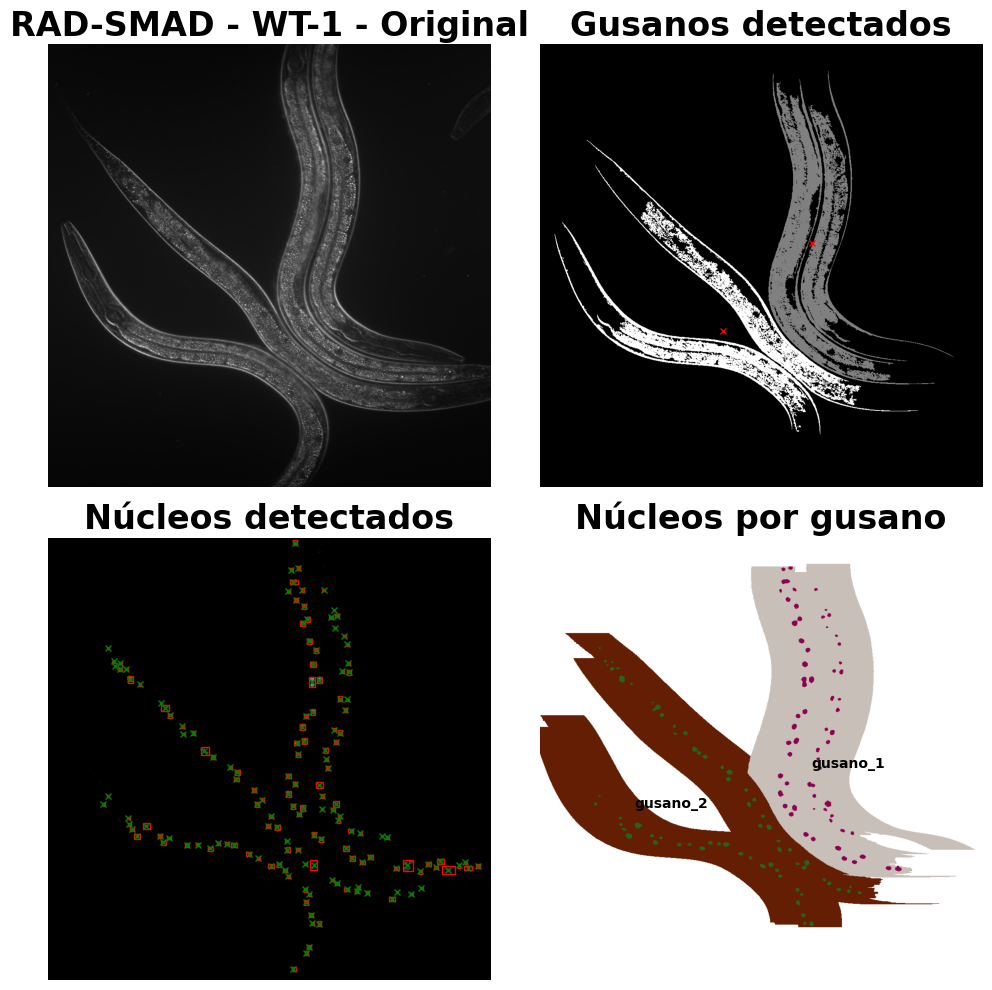

06:35:36.241 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 2.ids
06:35:36.241 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 2.ids
06:35:36.241 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 2.ids)
06:35:36.241 [main] INFO loci.formats.FormatHandler - Finding companion file
06:35:36.241 [main] INFO loci.formats.FormatHandler - Checking file version
06:35:36.243 [main] INFO loci.formats.FormatHandler - Reading metadata
06:35:36.300 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Float

/tmp/ipykernel_278/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


KeyboardInterrupt: 

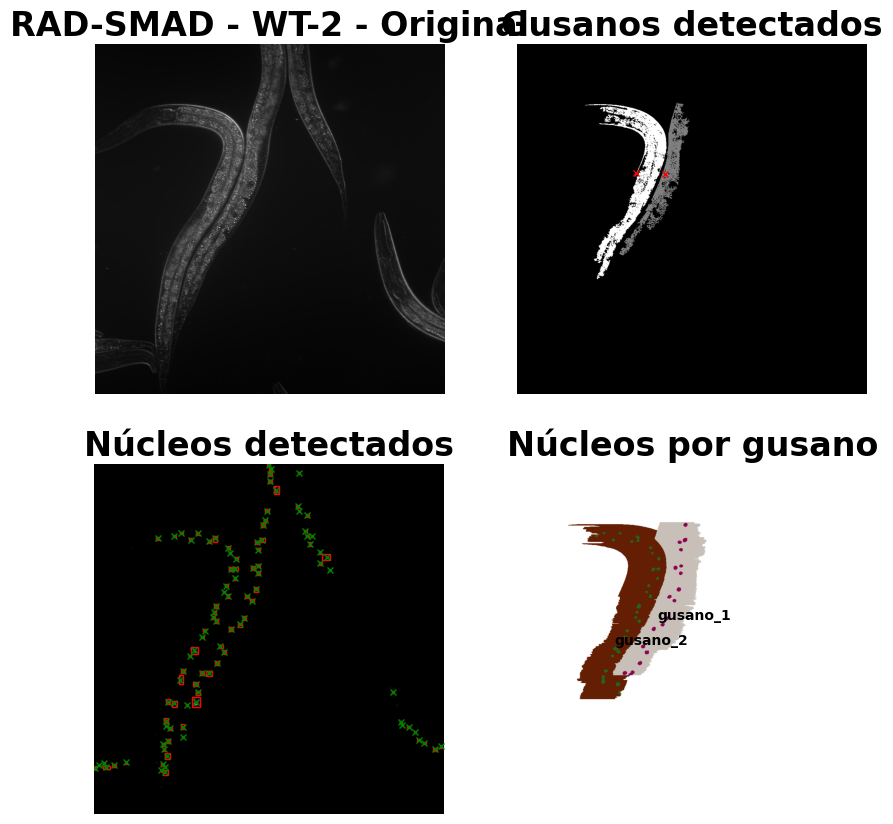

In [95]:
estadisticas_fluorescencias_wt = {}
i=1
for tracker in wormTrackers:
    tracker.procesarImagen(thresholdCampoClaro=0.25, thresholdFluo=0.05)
    tracker.buscarNucleos(tol_cerrada = 5, tol_abierta = 5)
    tracker.coordenadasDeNucleos()
    tracker.centroidesDeNucleos()
    tracker.buscarGusanos(iteraciones=8, con_rellenado_inundacion=False,
                                min_area=3500, tol_rellenado_1=3, tol_rellenado_2=1, max_iteracion=10)
    tracker.coordenadasDeGusanos()
    tracker.interseccionGusanoNucleos()
    tracker.graficarProcesamiento(modos=[0, 1, 3, 4], titulo=f"RAD-SMAD - WT-{i}")
    tracker.fluorescencia_de_nucleos()
    tracker.filtrar_por_cantidad_nucleos()
    _, _, estadisticas = tracker.eliminar_outliers()
    estadisticas_fluorescencias_wt[f"WT-{i}"] = estadisticas
    i += 1
    #tracker.graficar_violin_outliers(titulo="Comparación de fluorescencia por gusano")

In [ ]:
wormTrackers[0].fluorescenciasPorGusanoCorregido

{'gusano_1': {'nucleo_1': 1247.0,
  'nucleo_2': 20864.0,
  'nucleo_3': 31687.0,
  'nucleo_5': 4936.0,
  'nucleo_7': 10168.0,
  'nucleo_8': 9647.0,
  'nucleo_9': 9862.0,
  'nucleo_10': 7033.0,
  'nucleo_11': 8382.0,
  'nucleo_12': 9415.0,
  'nucleo_13': 10258.0,
  'nucleo_14': 14911.0,
  'nucleo_15': 5985.0,
  'nucleo_16': 11869.0,
  'nucleo_17': 13257.0,
  'nucleo_18': 22044.0,
  'nucleo_19': 2701.0,
  'nucleo_20': 22783.0,
  'nucleo_21': 15798.0,
  'nucleo_22': 20356.0,
  'nucleo_24': 11713.0,
  'nucleo_25': 18484.0,
  'nucleo_26': 23446.0,
  'nucleo_27': 25789.0,
  'nucleo_28': 13672.0,
  'nucleo_29': 35367.0,
  'nucleo_30': 32852.0,
  'nucleo_31': 15381.0,
  'nucleo_32': 33259.0,
  'nucleo_33': 38988.0,
  'nucleo_34': 16773.0,
  'nucleo_35': 17939.0,
  'nucleo_36': 16736.0,
  'nucleo_37': 38003.0,
  'nucleo_39': 17852.0,
  'nucleo_40': 9881.0,
  'nucleo_41': 13448.0,
  'nucleo_42': 3357.0,
  'nucleo_43': 2608.0}}

In [ ]:
def convertir_fluorescencias_a_dataFrame(wormTrackers, genotipo="WT"):
    data = []
    
    for i, tracker in enumerate(wormTrackers):
        for gusano, nucleos in tracker.fluorescenciasPorGusanoCorregido.items():
            data.append({
                "imagen" : f"{genotipo}-{i}",
                "gusano_id" : f"{gusano}",
                **nucleos
            })
    dataFrame = pd.DataFrame(data)

    return dataFrame

def convertir_estadisticas_a_dataFrame(diccionario_estadisticas, genotipo="WT"):
    data = []
    i = 1
    for imagen, gusanos in diccionario_estadisticas.items():
        if imagen.startswith(f"{genotipo}-{i}"):
            for gusano, estadisticas in gusanos.items():
                data.append({
                    "gusano_id" : f"{imagen}_{gusano}",
                    **estadisticas
                })
        i += 1
    dataFrame = pd.DataFrame(data)

    return dataFrame

In [ ]:
dataFrame_WT_estadisticas = convertir_estadisticas_a_dataFrame(estadisticas_fluorescencias_wt)
dataFrame_WT_fluo = convertir_fluorescencias_a_dataFrame(wormTrackers)
dataFrame_WT_estadisticas

,gusano_id,media,mediana,sigma,cv
0,WT-1_gusano_1,16378.230769,14911.0,10102.314418,0.616814
1,WT-2_gusano_1,2142.777778,2326.0,1327.463462,0.619506
2,WT-3_gusano_1,9676.342857,5981.0,9802.620916,1.013050
3,WT-4_gusano_1,4232.428571,4192.5,1227.992201,0.290139
4,WT-5_gusano_1,4603.636364,4454.0,3374.618662,0.733033
5,WT-6_gusano_1,6945.423077,6950.5,2195.222926,0.316068
6,WT-6_gusano_2,9877.894737,9330.0,4084.784163,0.413528
7,WT-7_gusano_1,9978.444444,9429.0,3686.699723,0.369466
8,WT-7_gusano_2,9447.318182,8796.0,4924.290177,0.521237
9,WT-8_gusano_1,5779.000000,5228.5,4111.778416,0.711503


In [ ]:
dataFrame_WT_estadisticas.to_excel("estadisticas_gusanos_WT.xlsx", index=False)
dataFrame_WT_fluo.to_excel("fluorescencia_nucleos_gusanos_WT.xlsx", index=False)

In [ ]:
def graficar_violin_outliers_multiple(
        wormTrackers,
        titulo="Comparación de fluorescencia por gusano",
        dot_size=5,
        dot_alpha=0.4,
        ylim_pre=None,
        ylim_post=None,
        label="lon-2"):
    """
    Grafica violin plots de fluorescencia para varias instancias de WormTracker.
    Cada instancia tiene su propio bloque en el eje X y se muestran los gusanos.
    Dos filas: arriba pre-filtrado, abajo post-filtrado.

    Parameters
    ----------
    wormTrackers : list
        Lista de objetos WormTracker con atributos:
            - fluorescenciasPorGusano
            - fluorescenciasPorGusanoCorregido
            - nombre (opcional, para mostrar en el eje X)
    dot_size : float
        Tamaño de los puntos en stripplot
    dot_alpha : float
        Transparencia de los puntos en stripplot
    ylim_pre : tuple or None
        (min, max) para el eje Y del gráfico pre-filtrado. Si None, ajusta automático.
    ylim_post : tuple or None
        (min, max) para el eje Y del gráfico post-filtrado. Si None, ajusta automático.
    """

    def extract_xy(wormTrackers, post=False):
        x_labels, y_values = [], []
        for idx, tracker in enumerate(wormTrackers):
            dicc = tracker.fluorescenciasPorGusanoCorregido if post else tracker.fluorescenciasPorGusanoOriginal
            instancia = getattr(tracker, "nombre", f"{label} {idx+1}")
            for gusano, nucleos in dicc.items():
                for _, val in nucleos.items():
                    # Las etiquetas para ser únicas por gráfico (pre/post)
                    x_labels.append(f"{instancia} - {gusano}")
                    y_values.append(val)
        return x_labels, y_values

    # Pre y post
    x_pre, y_pre = extract_xy(wormTrackers, post=False)
    x_post, y_post = extract_xy(wormTrackers, post=True)

    fig, axes = plt.subplots(2, 1, figsize=(20, 12))  #  sin sharey para independencia de limite del eje y
    plt.suptitle(titulo, fontsize=25, fontweight="bold")

    # ----------- Pre-filtrado -----------
    sns.violinplot(x=x_pre, y=y_pre, hue=x_pre,
                   inner=None, linewidth=1, legend=False,
                   palette="Pastel1", ax=axes[0])
    sns.stripplot(x=x_pre, y=y_pre, color="black", size=dot_size, alpha=dot_alpha, ax=axes[0])
    sns.pointplot(x=x_pre, y=y_pre, color="red", markers="D", linestyle="none",
                  markersize=6, errorbar="sd", ax=axes[0])
    axes[0].set_title("Pre-filtrado (todas las imágenes)", fontsize=16, fontweight="bold")
    axes[0].set_ylabel("Fluorescencia")
    axes[0].grid(axis="y", linestyle="--", alpha=0.5)
    axes[0].tick_params(axis="x", rotation=60)
    if ylim_pre is not None:
        axes[0].set_ylim(ylim_pre)

    # ----------- Post-filtrado -----------
    sns.violinplot(x=x_post, y=y_post, hue=x_post,
                   inner=None, linewidth=1, legend=False,
                   palette="Purples", ax=axes[1])
    sns.stripplot(x=x_post, y=y_post, color="black", size=dot_size, alpha=dot_alpha, ax=axes[1])
    sns.pointplot(x=x_post, y=y_post, color="red", markers="D", linestyle="none",
                  markersize=6, errorbar="sd", ax=axes[1])
    axes[1].set_title("Post-filtrado (todas las imágenes)", fontsize=16, fontweight="bold")
    axes[1].set_ylabel("Fluorescencia")
    axes[1].set_xlabel("Instancia - Gusano")
    axes[1].grid(axis="y", linestyle="--", alpha=0.5)
    axes[1].tick_params(axis="x", rotation=60)
    if ylim_post is not None:
        axes[1].set_ylim(ylim_post)

    # Agregar el número de nucleos sobre cada violín plot en el gráfico post-filtrado
    nucleo_counts = [x_post.count(label) for label in set(x_post)]  # Conteo de los nucleos por instancia
    for i, count in enumerate(nucleo_counts):
        axes[1].text(i, max(y_post)*1.05, f'n={count}', ha='center', va='bottom', fontsize=12)

    plt.tight_layout(rect=[0, 0, 1, 0.96])

    plt.show()

    return fig



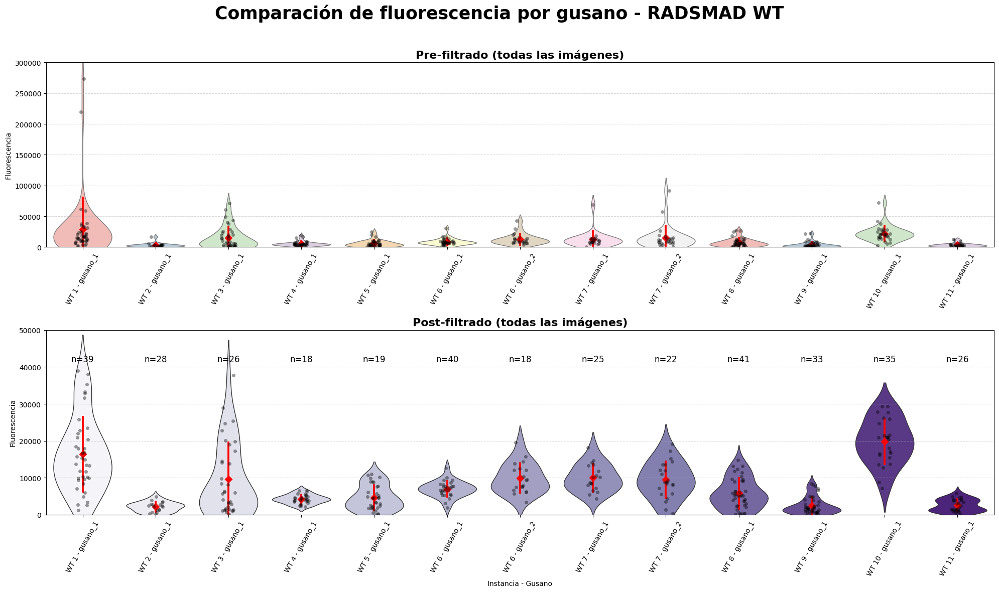

In [ ]:
radsmad_wt_violin = graficar_violin_outliers_multiple(wormTrackers=wormTrackers, 
                                                    titulo="Comparación de fluorescencia por gusano - RADSMAD WT",
                                                    ylim_pre=(0, 300000), 
                                                    ylim_post=(0, 50000),
                                                    label="WT")

In [ ]:
ruta_output_WT = "/home/nephelim/Documentos/Investigacion/BioPictureTools/output/WT/"

figuras_analisis_gusanos = []
for tracker in wormTrackers:
    figuras_analisis_gusanos.append(tracker.figuraGusanos)

i = 1
for figura in figuras_analisis_gusanos:
    figura.savefig(ruta_output_WT + f"RADSMAD_WT_{i}", dpi=300, bbox_inches="tight")
    i += 1

In [ ]:
# Ruta base donde están los archivos
ruta_base = "/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/"

# Archivo que contiene la lista de nombres
archivo_lista = ruta_base + "nombre_imagenes_lon_2.txt"

# Leer los nombres y armar paths completos
with open(archivo_lista, "r", encoding="utf-8") as f:
    nombres_archivos = [line.strip() for line in f if line.strip()]

rutas_completas = [os.path.join(ruta_base, nombre) for nombre in nombres_archivos]


04:51:57.652 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 1.ids
04:51:57.652 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 1.ids
04:51:57.652 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 1.ids)
04:51:57.652 [main] INFO loci.formats.FormatHandler - Finding companion file
04:51:57.652 [main] INFO loci.formats.FormatHandler - Checking file version
04:51:57.662 [main] INFO loci.formats.FormatHandler - Reading metadata
04:51:57.727 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Float

/tmp/ipykernel_278/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


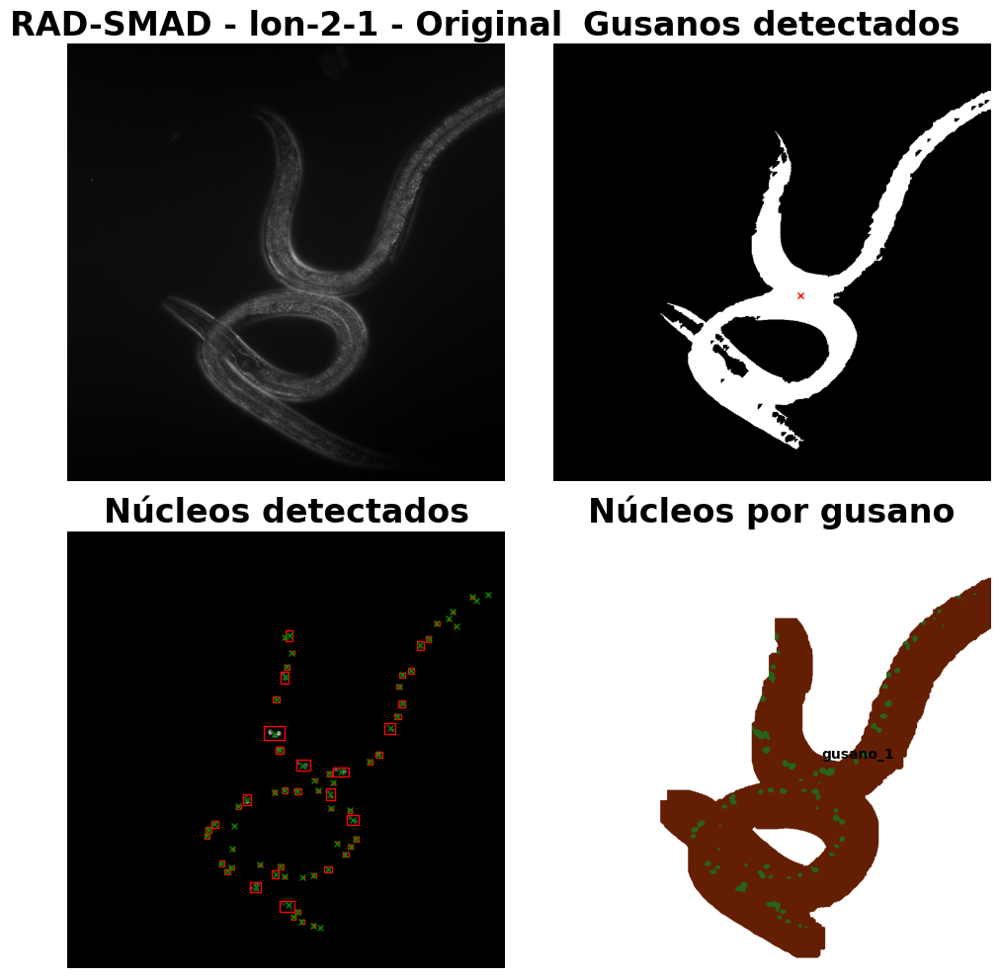

04:52:11.751 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 2.ids
04:52:11.751 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 2.ids
04:52:11.751 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 2.ids)
04:52:11.751 [main] INFO loci.formats.FormatHandler - Finding companion file
04:52:11.751 [main] INFO loci.formats.FormatHandler - Checking file version
04:52:11.762 [main] INFO loci.formats.FormatHandler - Reading metadata
04:52:11.820 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Float

/tmp/ipykernel_278/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


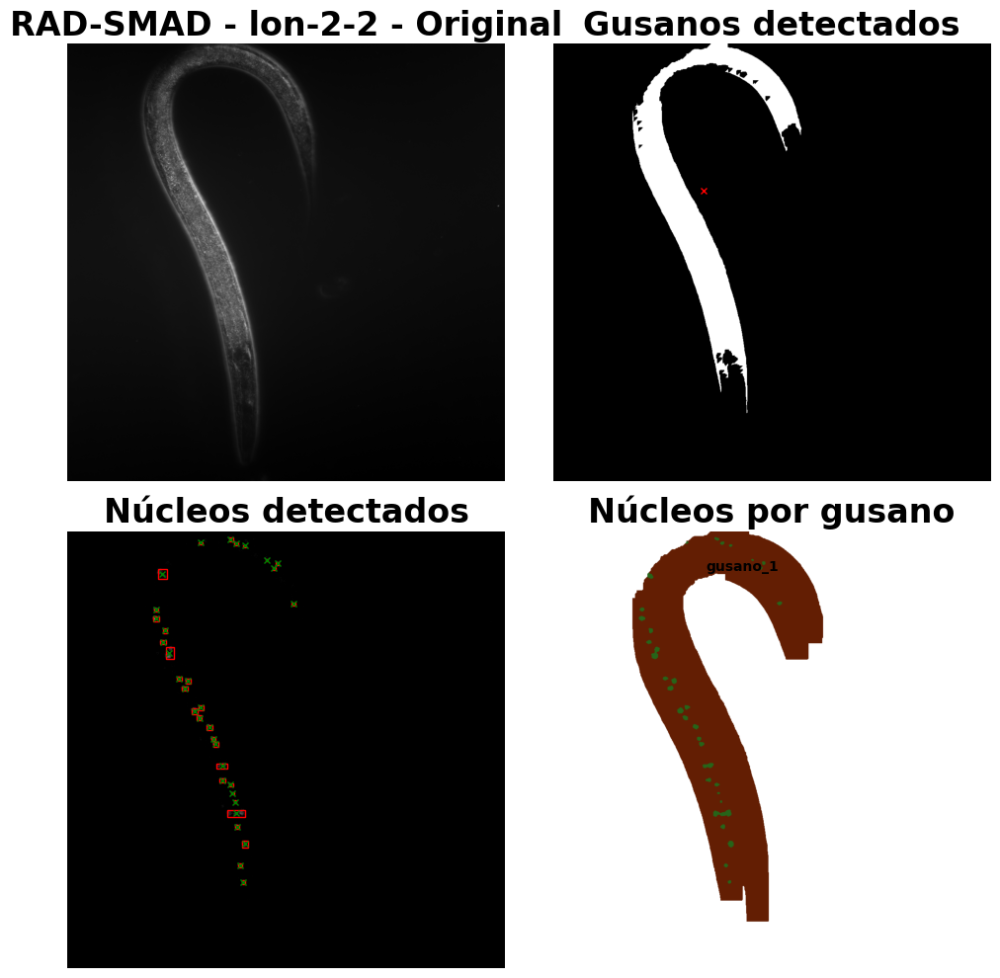

04:52:24.772 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 3.ids
04:52:24.773 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 3.ids
04:52:24.773 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 3.ids)
04:52:24.773 [main] INFO loci.formats.FormatHandler - Finding companion file
04:52:24.773 [main] INFO loci.formats.FormatHandler - Checking file version
04:52:24.776 [main] INFO loci.formats.FormatHandler - Reading metadata
04:52:24.809 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Float

/tmp/ipykernel_278/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


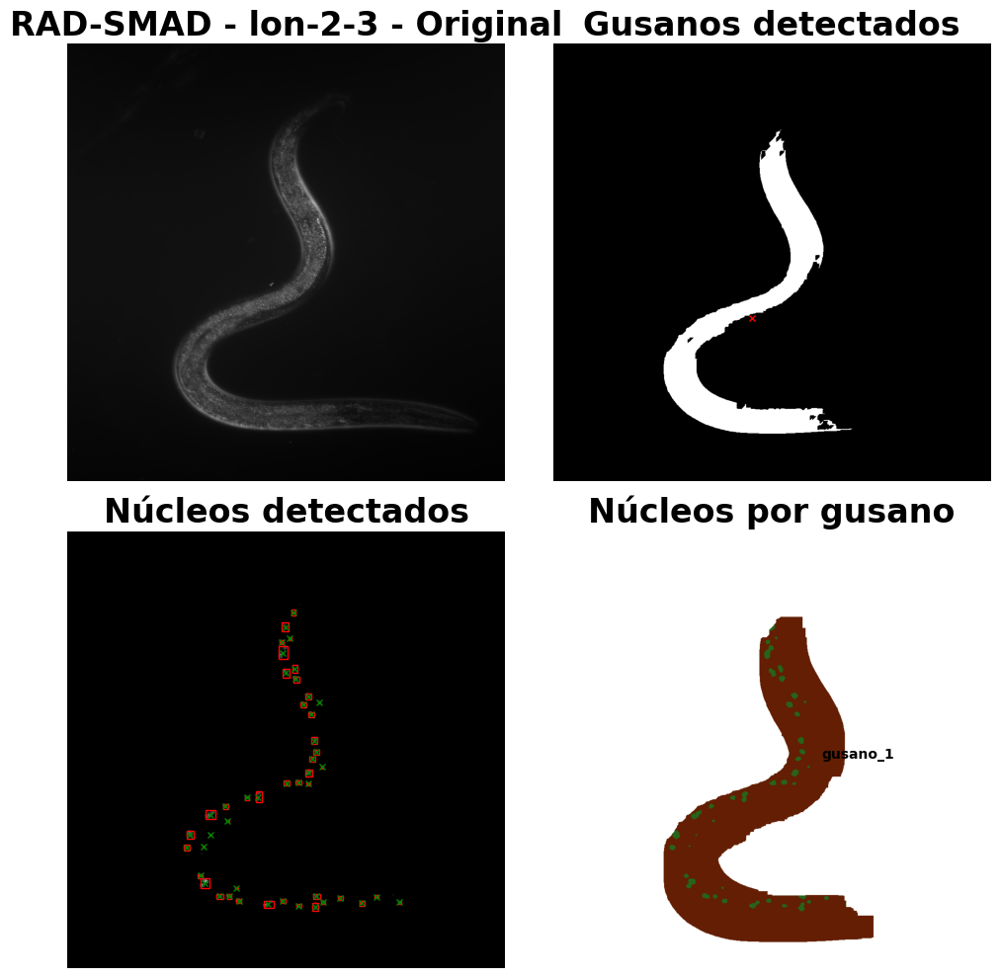

04:52:37.517 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 4.ids
04:52:37.517 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 4.ids
04:52:37.517 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 4.ids)
04:52:37.517 [main] INFO loci.formats.FormatHandler - Finding companion file
04:52:37.517 [main] INFO loci.formats.FormatHandler - Checking file version
04:52:37.523 [main] INFO loci.formats.FormatHandler - Reading metadata
04:52:37.591 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Float

/tmp/ipykernel_278/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


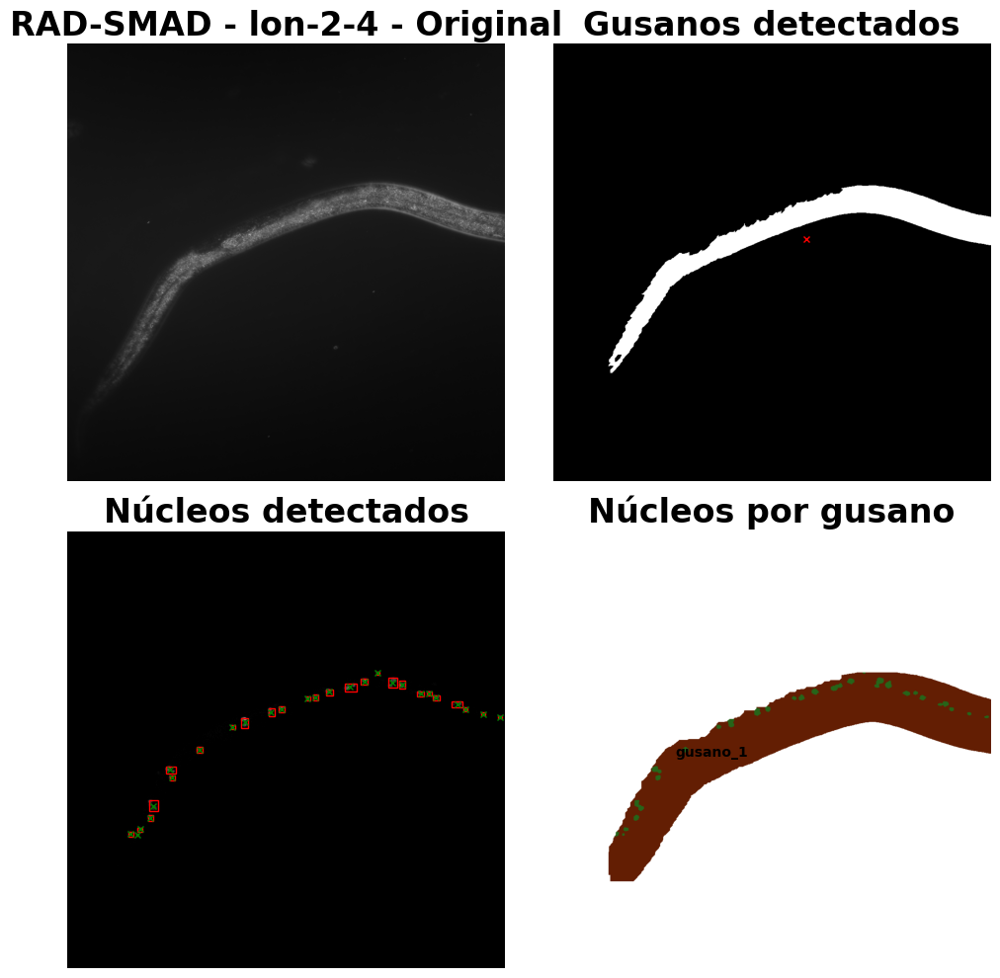

04:52:49.874 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 5.ids
04:52:49.874 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 5.ids
04:52:49.874 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 5.ids)
04:52:49.874 [main] INFO loci.formats.FormatHandler - Finding companion file
04:52:49.874 [main] INFO loci.formats.FormatHandler - Checking file version
04:52:49.878 [main] INFO loci.formats.FormatHandler - Reading metadata
04:52:49.951 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Float

/tmp/ipykernel_278/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


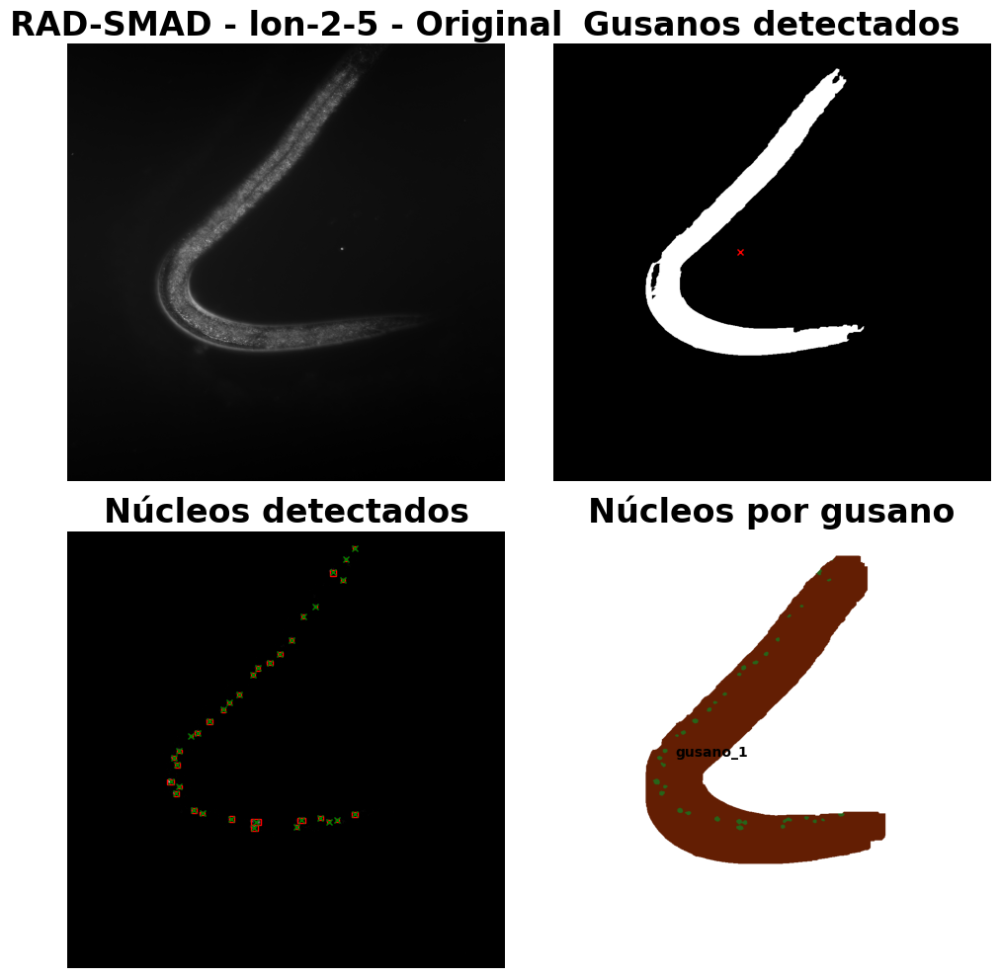

04:53:03.394 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 6.ids
04:53:03.394 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 6.ids
04:53:03.394 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 6.ids)
04:53:03.394 [main] INFO loci.formats.FormatHandler - Finding companion file
04:53:03.394 [main] INFO loci.formats.FormatHandler - Checking file version
04:53:03.400 [main] INFO loci.formats.FormatHandler - Reading metadata
04:53:03.451 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Float

/tmp/ipykernel_278/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


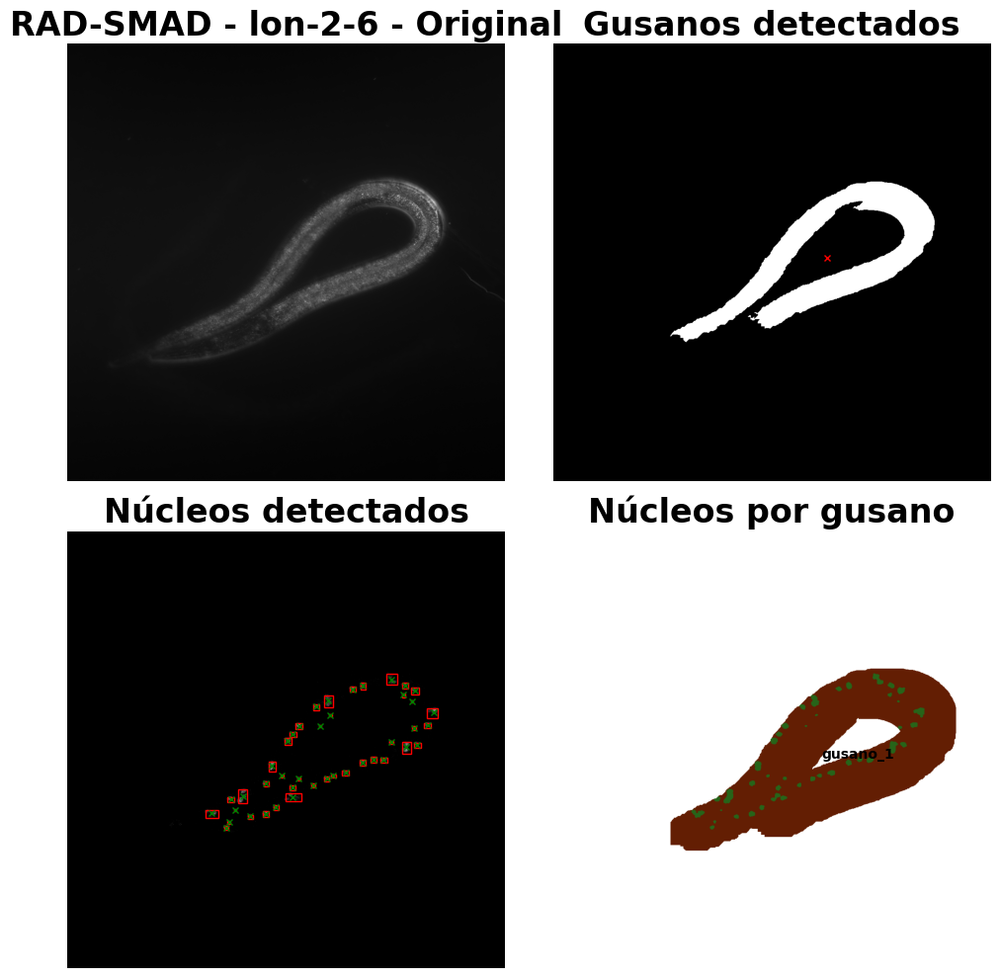

04:53:16.748 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 7.ids
04:53:16.749 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 7.ids
04:53:16.749 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 7.ids)
04:53:16.749 [main] INFO loci.formats.FormatHandler - Finding companion file
04:53:16.749 [main] INFO loci.formats.FormatHandler - Checking file version
04:53:16.752 [main] INFO loci.formats.FormatHandler - Reading metadata
04:53:16.811 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Float

/tmp/ipykernel_278/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


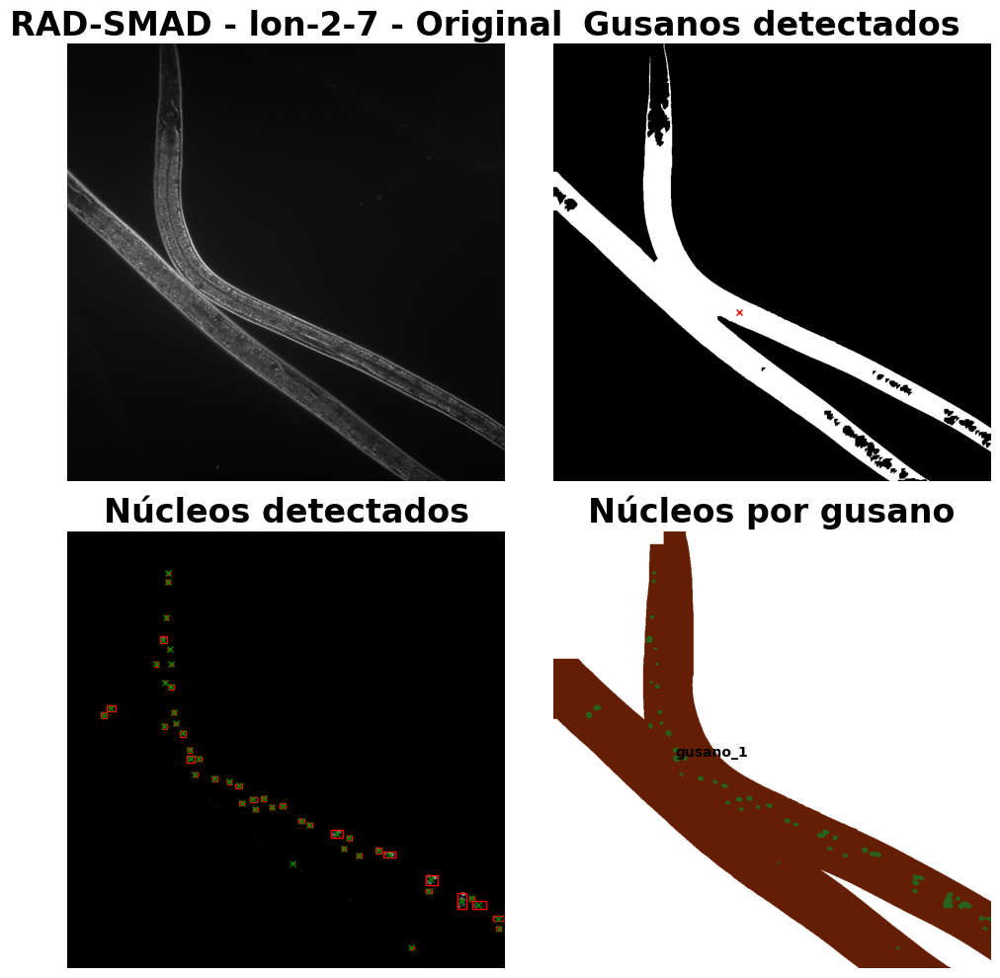

04:53:31.425 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 8.ids
04:53:31.425 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 8.ids
04:53:31.425 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 8.ids)
04:53:31.426 [main] INFO loci.formats.FormatHandler - Finding companion file
04:53:31.426 [main] INFO loci.formats.FormatHandler - Checking file version
04:53:31.430 [main] INFO loci.formats.FormatHandler - Reading metadata
04:53:31.453 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Float

/tmp/ipykernel_278/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


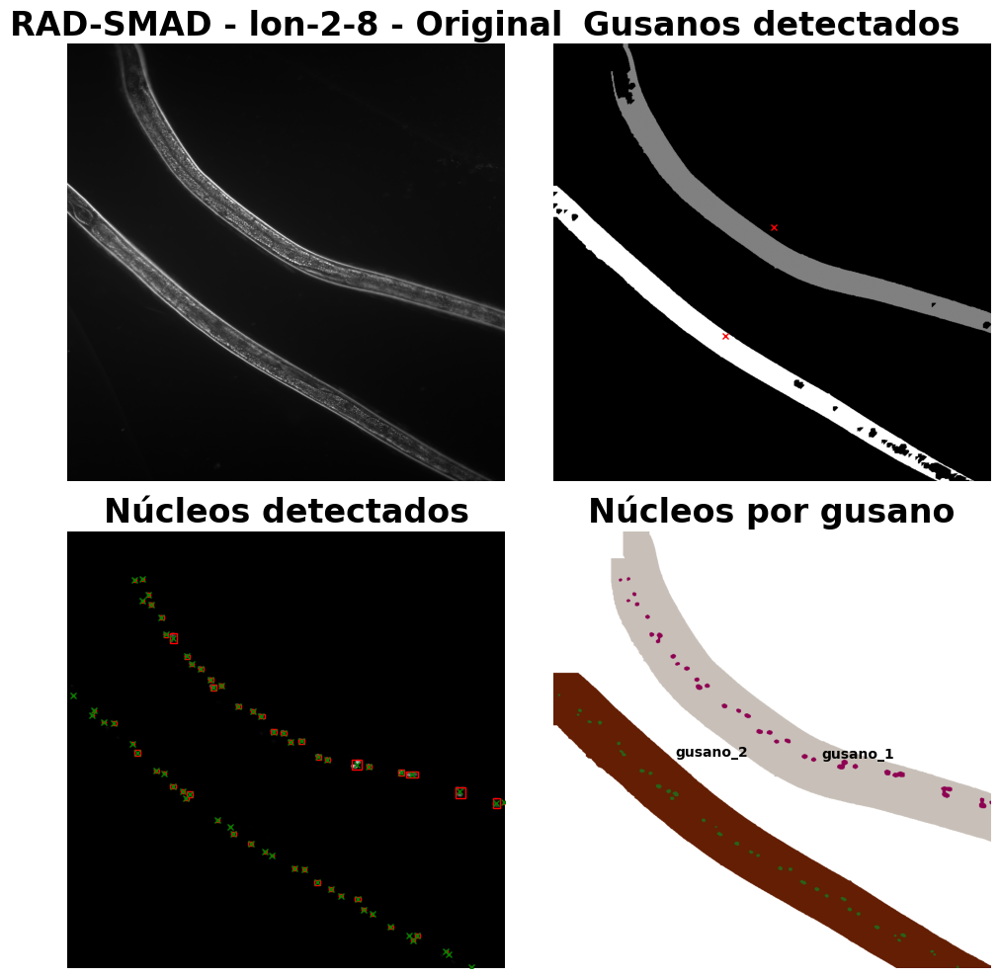

04:53:47.432 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 9.ids
04:53:47.432 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 9.ids
04:53:47.432 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 9.ids)
04:53:47.432 [main] INFO loci.formats.FormatHandler - Finding companion file
04:53:47.432 [main] INFO loci.formats.FormatHandler - Checking file version
04:53:47.434 [main] INFO loci.formats.FormatHandler - Reading metadata
04:53:47.489 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Float

/tmp/ipykernel_278/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


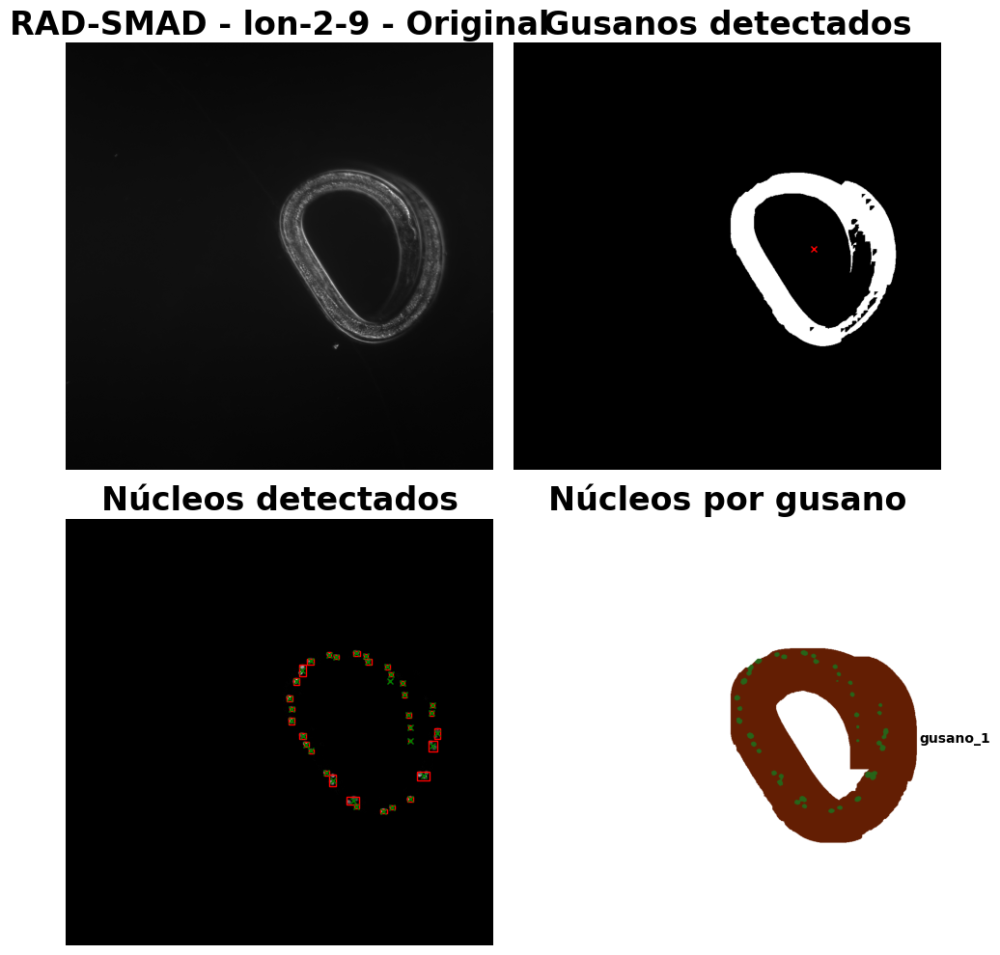

04:54:03.506 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 10.ids
04:54:03.506 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 10.ids
04:54:03.506 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 10.ids)
04:54:03.506 [main] INFO loci.formats.FormatHandler - Finding companion file
04:54:03.506 [main] INFO loci.formats.FormatHandler - Checking file version
04:54:03.512 [main] INFO loci.formats.FormatHandler - Reading metadata
04:54:03.563 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Fl

/tmp/ipykernel_278/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


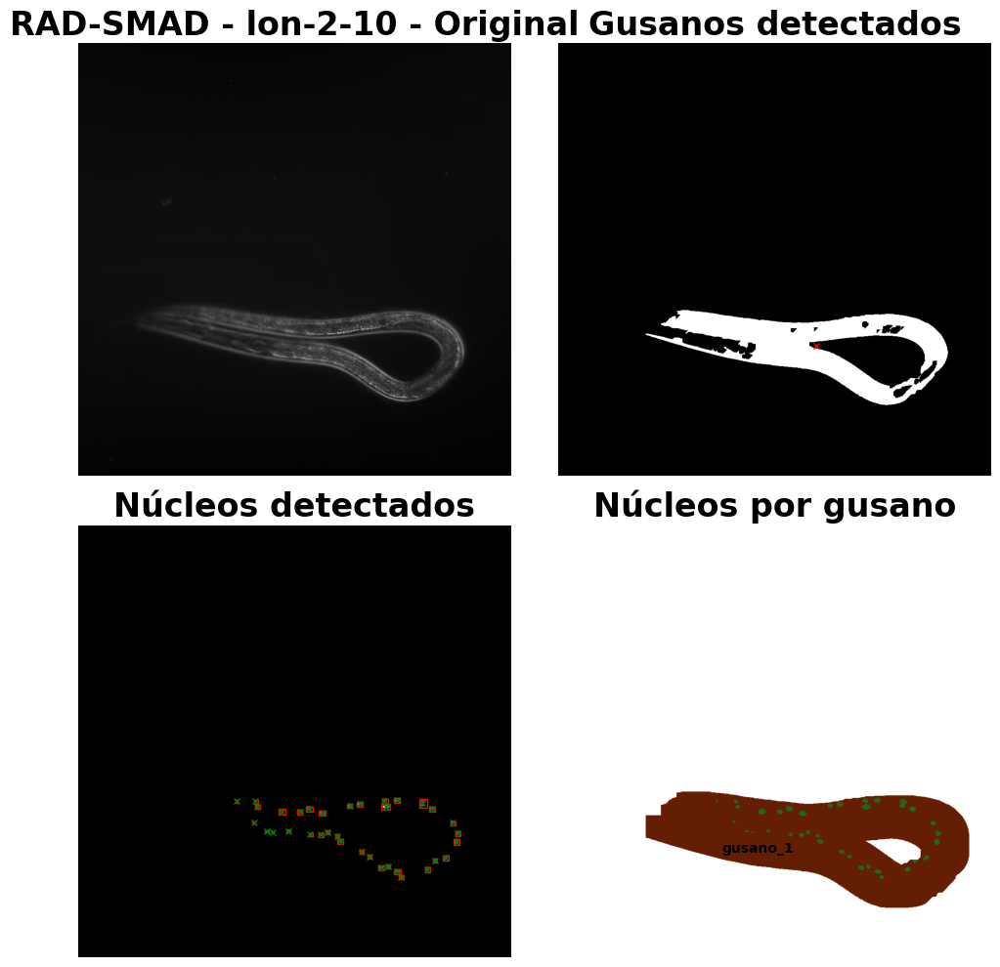

04:54:22.795 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 11.ids
04:54:22.795 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 11.ids
04:54:22.795 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 11.ids)
04:54:22.795 [main] INFO loci.formats.FormatHandler - Finding companion file
04:54:22.795 [main] INFO loci.formats.FormatHandler - Checking file version
04:54:22.799 [main] INFO loci.formats.FormatHandler - Reading metadata
04:54:22.880 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Fl

/tmp/ipykernel_278/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


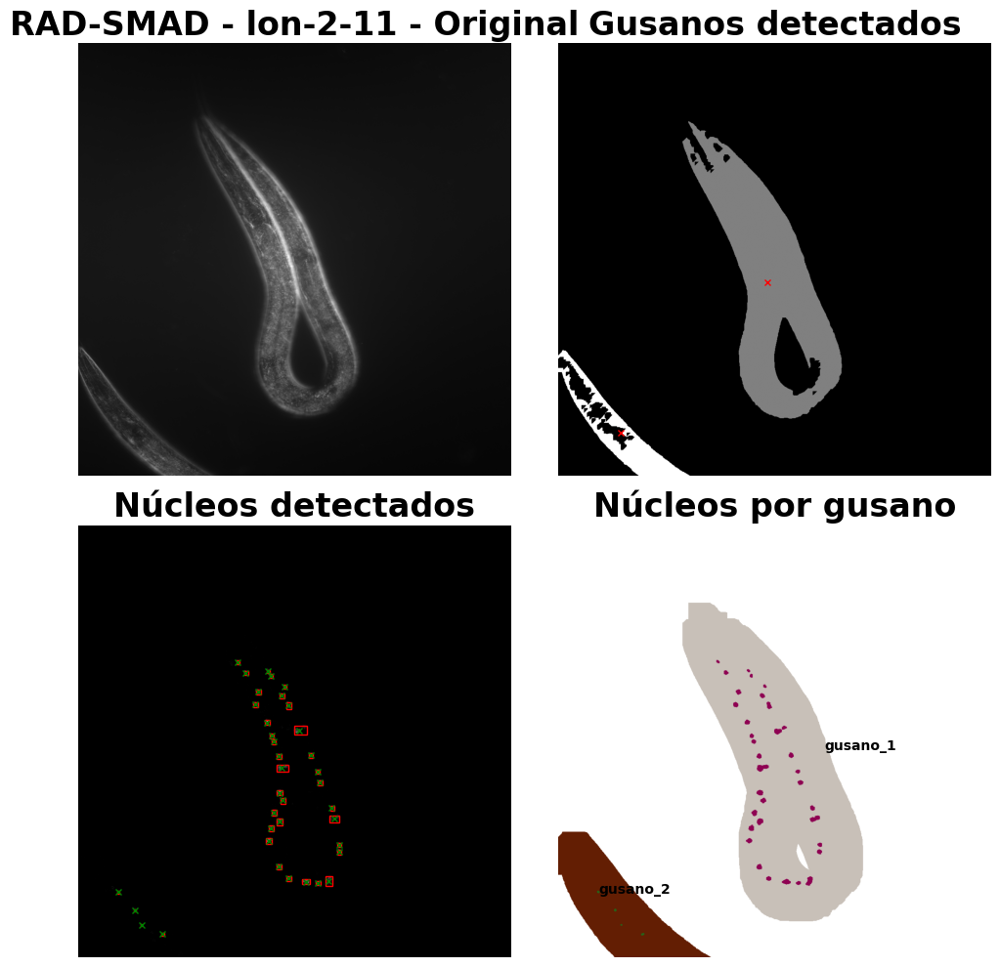

Se elimino el gusano gusano_2
04:54:40.519 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 12.ids
04:54:40.519 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 12.ids
04:54:40.519 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD lon-2/RADSMAD lon-2 12.ids)
04:54:40.519 [main] INFO loci.formats.FormatHandler - Finding companion file
04:54:40.519 [main] INFO loci.formats.FormatHandler - Checking file version
04:54:40.523 [main] INFO loci.formats.FormatHandler - Reading metadata
04:54:40.568 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at 

/tmp/ipykernel_278/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


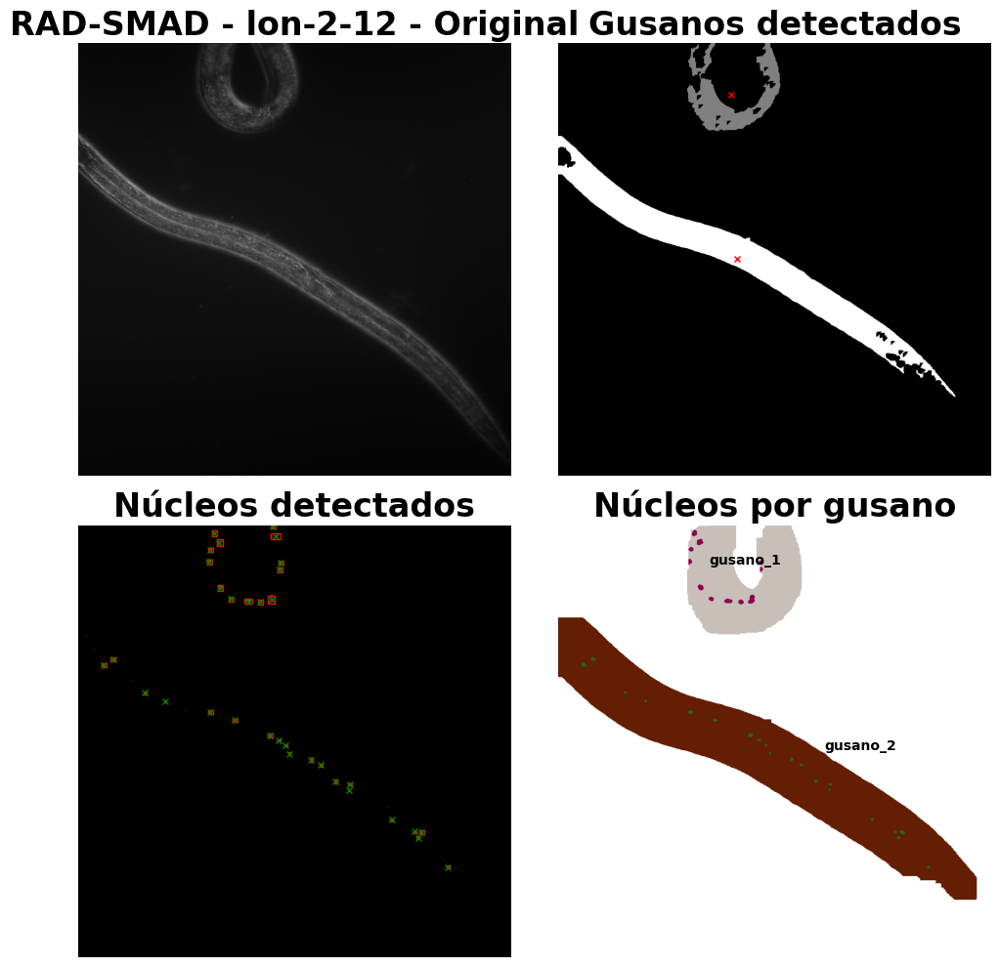

Se elimino el gusano gusano_1


In [ ]:
wormTrackers_lon_2 = []

for ruta in rutas_completas:
    wormTrackers_lon_2.append(WormTracker(ruta))

estadisticas_fluorescencias_lon_2 = {}

i = 1
for tracker in wormTrackers_lon_2:
    tracker.procesarImagen(thresholdCampoClaro=0.20, thresholdFluo=0.05) # Cambio a menor threshold
    tracker.buscarNucleos(tol_cerrada = 4, tol_abierta = 5) # cambio tol cerrada
    tracker.coordenadasDeNucleos()
    tracker.centroidesDeNucleos()
    tracker.buscarGusanos(tol_cerrada_1=2, tol_cerrada_2=2, iteraciones=8, con_rellenado_inundacion=False,
                        min_area=3500, tol_rellenado_1=2, tol_rellenado_2=2, max_iteracion=10) 
    tracker.coordenadasDeGusanos()
    tracker.interseccionGusanoNucleos()
    tracker.graficarProcesamiento(modos=[0, 1, 3, 4], titulo=f"RAD-SMAD - lon-2-{i}")
    tracker.fluorescencia_de_nucleos()
    tracker.filtrar_por_cantidad_nucleos()
    _, _, estadisticas = tracker.eliminar_outliers()
    estadisticas_fluorescencias_lon_2[f"lon-2-{i}"] = estadisticas
    i += 1

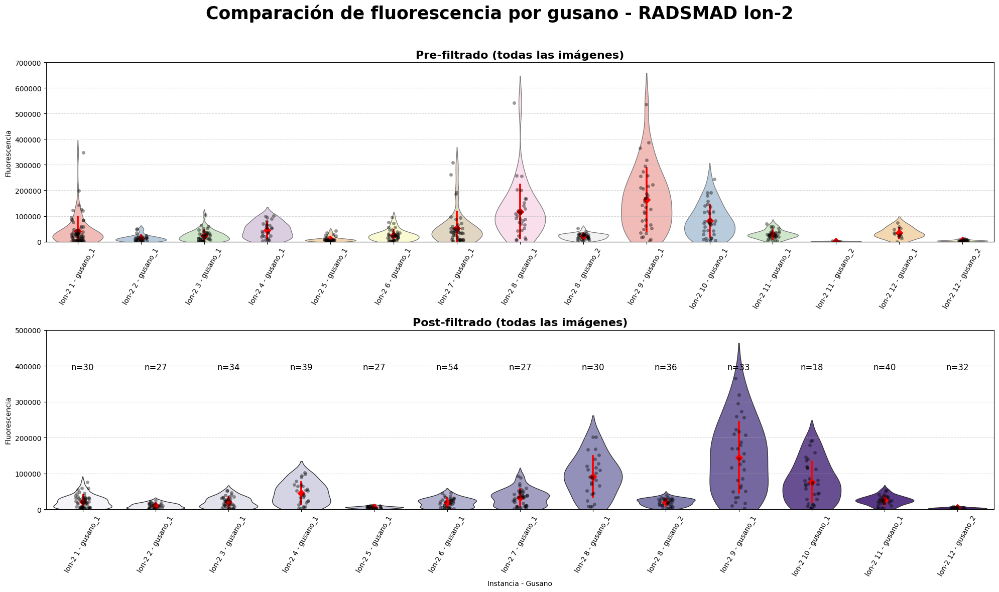

In [ ]:
radsmad_lon_2_violin = graficar_violin_outliers_multiple(wormTrackers=wormTrackers_lon_2, 
                                                    titulo="Comparación de fluorescencia por gusano - RADSMAD lon-2",
                                                    ylim_pre=(0, 700000), 
                                                    ylim_post=(0,500000),
                                                    label="lon-2")

In [ ]:
ruta_output_lon_2 = "/home/nephelim/Documentos/Investigacion/BioPictureTools/output/lon_2/"

figuras_analisis_gusanos_lon_2 = []
for tracker in wormTrackers_lon_2:
    figuras_analisis_gusanos_lon_2.append(tracker.figuraGusanos)

i = 1
for figura in figuras_analisis_gusanos_lon_2:
    figura.savefig(ruta_output_lon_2 + f"RADSMAD_lon_2_{i}", dpi=300, bbox_inches="tight")
    i += 1

In [ ]:
# Ruta base donde están los archivos
ruta_base = "/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/"

# Archivo que contiene la lista de nombres
archivo_lista = ruta_base + "nombre_imagenes_ztf_30.txt"

# Leer los nombres y armar paths completos
with open(archivo_lista, "r", encoding="utf-8") as f:
    nombres_archivos = [line.strip() for line in f if line.strip()]

rutas_completas = [os.path.join(ruta_base, nombre) for nombre in nombres_archivos]

In [ ]:
dataFrame_lon_2_estadisticas = convertir_estadisticas_a_dataFrame(estadisticas_fluorescencias_lon_2, genotipo="lon-2")
dataFrame_lon_2_fluo = convertir_fluorescencias_a_dataFrame(wormTrackers_lon_2, genotipo="lon-2")
dataFrame_lon_2_estadisticas

,gusano_id,media,mediana,sigma,cv
0,lon-2-1_gusano_1,21661.981481,19121.5,17422.958255,0.804310
1,lon-2-2_gusano_1,9487.733333,9103.5,7139.178393,0.752464
2,lon-2-3_gusano_1,19254.589744,15102.0,15180.756291,0.788423
3,lon-2-4_gusano_1,44662.185185,40153.0,31194.801473,0.698461
4,lon-2-5_gusano_1,5152.777778,4875.0,2825.408716,0.548327
5,lon-2-6_gusano_1,18436.583333,19010.0,13133.420643,0.712357
6,lon-2-7_gusano_1,32263.425000,33727.5,23712.117113,0.734953
7,lon-2-8_gusano_1,91563.111111,89305.0,57023.915207,0.622783
8,lon-2-8_gusano_2,19141.333333,19011.0,10150.047228,0.530269
9,lon-2-9_gusano_1,144464.625000,137909.0,98901.525752,0.684607


In [ ]:
dataFrame_lon_2_estadisticas.to_excel("estadisticas_gusanos_lon_2.xlsx", index=False)
dataFrame_lon_2_fluo.to_excel("fluorescencia_nucleos_gusanos_lon_2.xlsx", index=False)

06:36:50.989 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 1.ids
06:36:50.989 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 1.ids
06:36:50.989 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 1.ids)
06:36:50.989 [main] INFO loci.formats.FormatHandler - Finding companion file
06:36:50.989 [main] INFO loci.formats.FormatHandler - Checking file version
06:36:50.993 [main] INFO loci.formats.FormatHandler - Reading metadata
06:36:51.156 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Float

/tmp/ipykernel_278/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


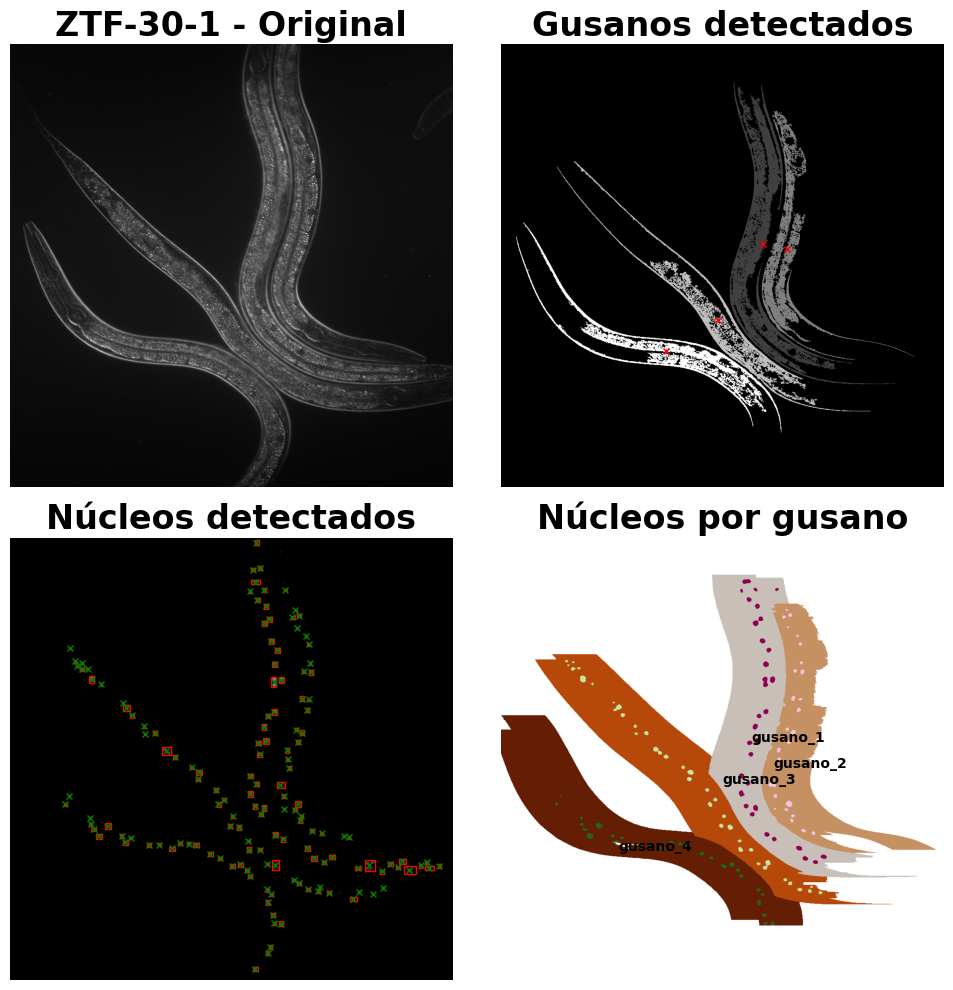

06:37:21.999 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 2.ids
06:37:21.999 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 2.ids
06:37:21.999 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 2.ids)
06:37:21.999 [main] INFO loci.formats.FormatHandler - Finding companion file
06:37:21.999 [main] INFO loci.formats.FormatHandler - Checking file version
06:37:22.001 [main] INFO loci.formats.FormatHandler - Reading metadata
06:37:22.021 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Float

/tmp/ipykernel_278/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


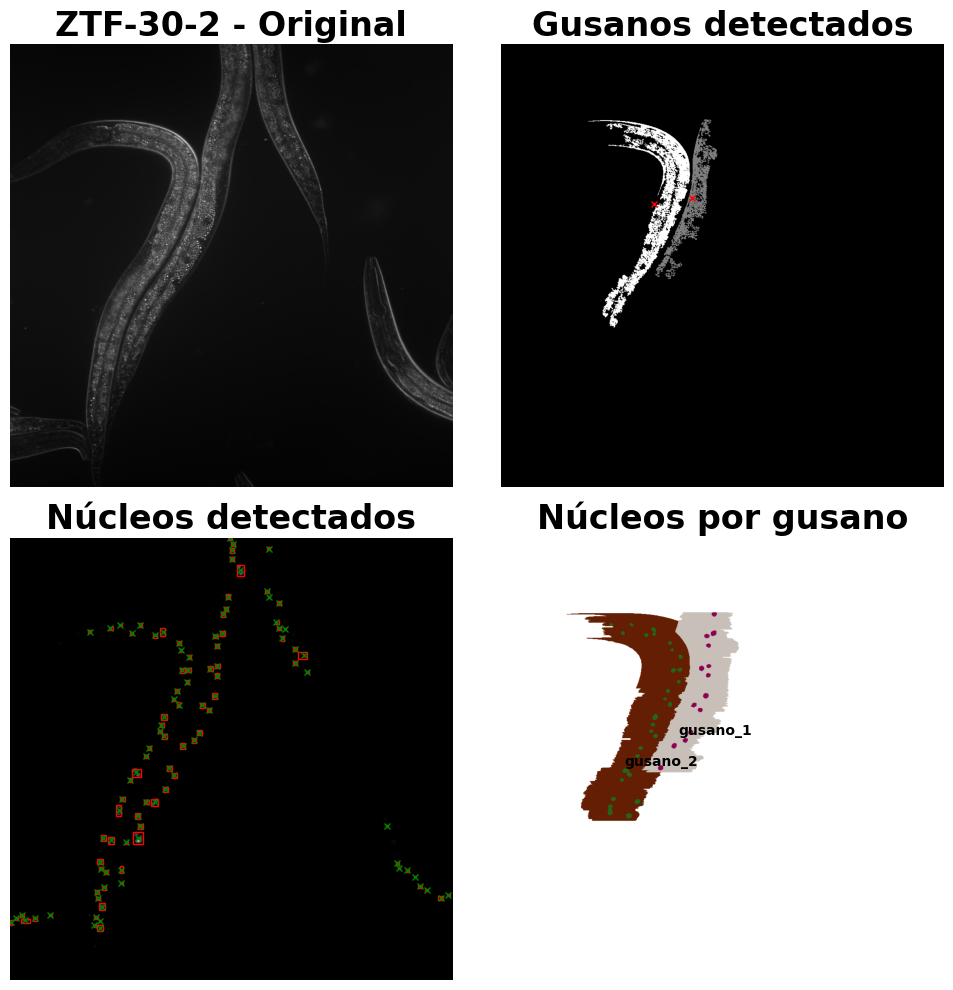

Se elimino el gusano gusano_1
06:37:55.519 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 3.ids
06:37:55.519 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 3.ids
06:37:55.519 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 3.ids)
06:37:55.519 [main] INFO loci.formats.FormatHandler - Finding companion file
06:37:55.520 [main] INFO loci.formats.FormatHandler - Checking file version
06:37:55.520 [main] INFO loci.formats.FormatHandler - Reading metadata
06:37:55.541 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at jav

/tmp/ipykernel_278/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


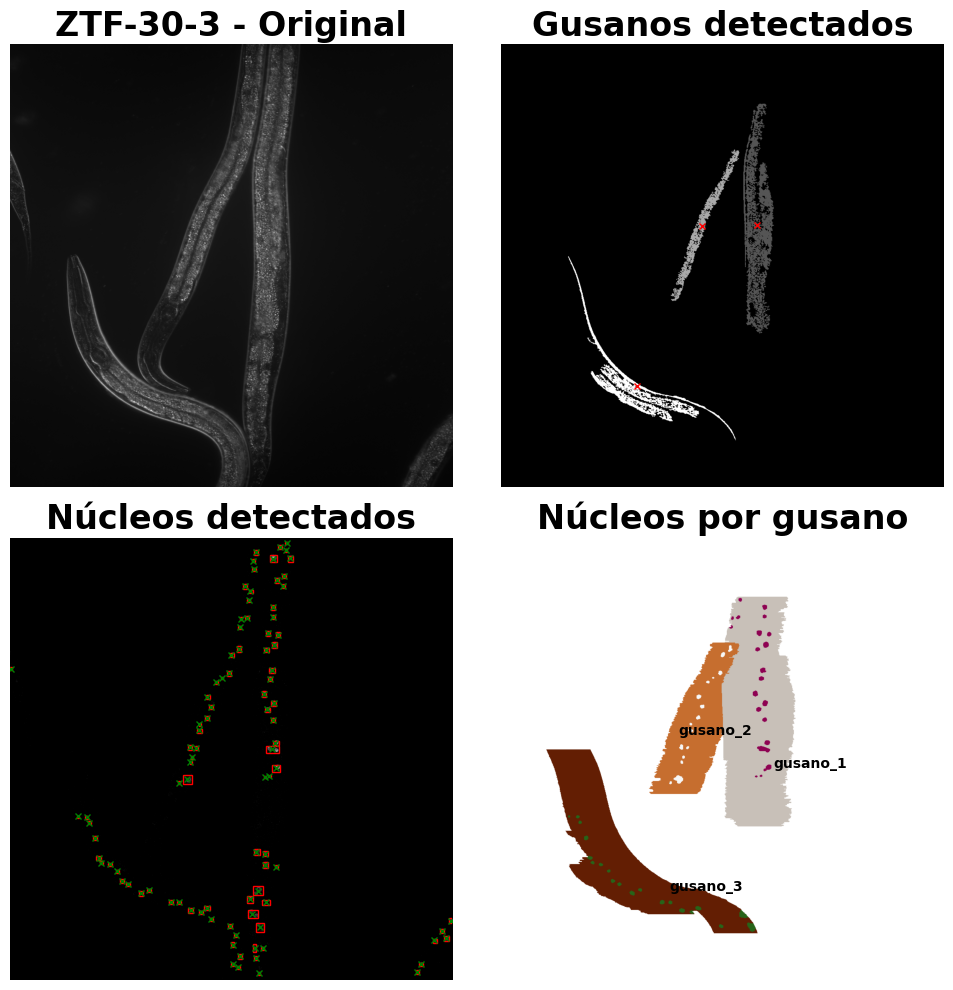

06:38:22.333 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 4.ids
06:38:22.333 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 4.ids
06:38:22.333 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 4.ids)
06:38:22.333 [main] INFO loci.formats.FormatHandler - Finding companion file
06:38:22.333 [main] INFO loci.formats.FormatHandler - Checking file version
06:38:22.335 [main] INFO loci.formats.FormatHandler - Reading metadata
06:38:22.367 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Float

/tmp/ipykernel_278/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


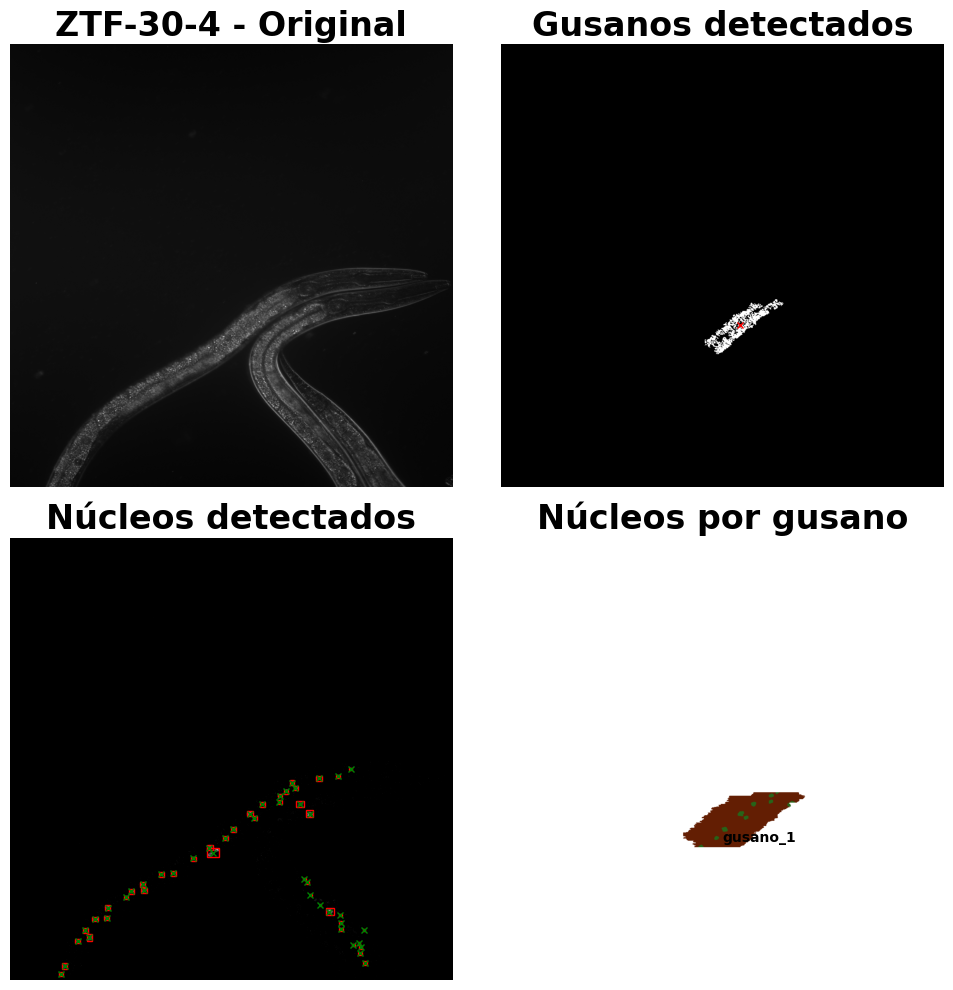

Se elimino el gusano gusano_1
06:38:46.734 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 5.ids
06:38:46.734 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 5.ids
06:38:46.734 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 5.ids)
06:38:46.734 [main] INFO loci.formats.FormatHandler - Finding companion file
06:38:46.734 [main] INFO loci.formats.FormatHandler - Checking file version
06:38:46.736 [main] INFO loci.formats.FormatHandler - Reading metadata
06:38:46.762 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at jav

/tmp/ipykernel_278/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


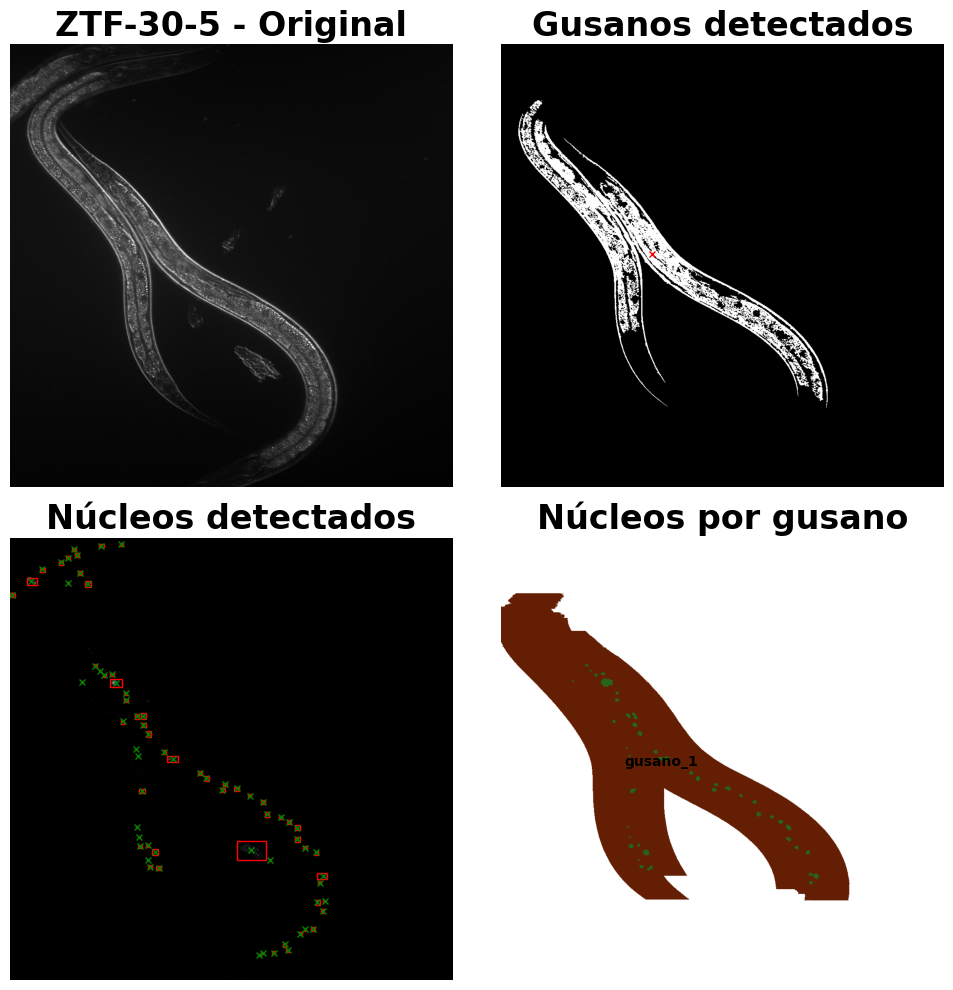

06:39:10.610 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 6.ids
06:39:10.610 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 6.ids
06:39:10.610 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 6.ids)
06:39:10.610 [main] INFO loci.formats.FormatHandler - Finding companion file
06:39:10.610 [main] INFO loci.formats.FormatHandler - Checking file version
06:39:10.611 [main] INFO loci.formats.FormatHandler - Reading metadata
06:39:10.633 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Float

/tmp/ipykernel_278/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


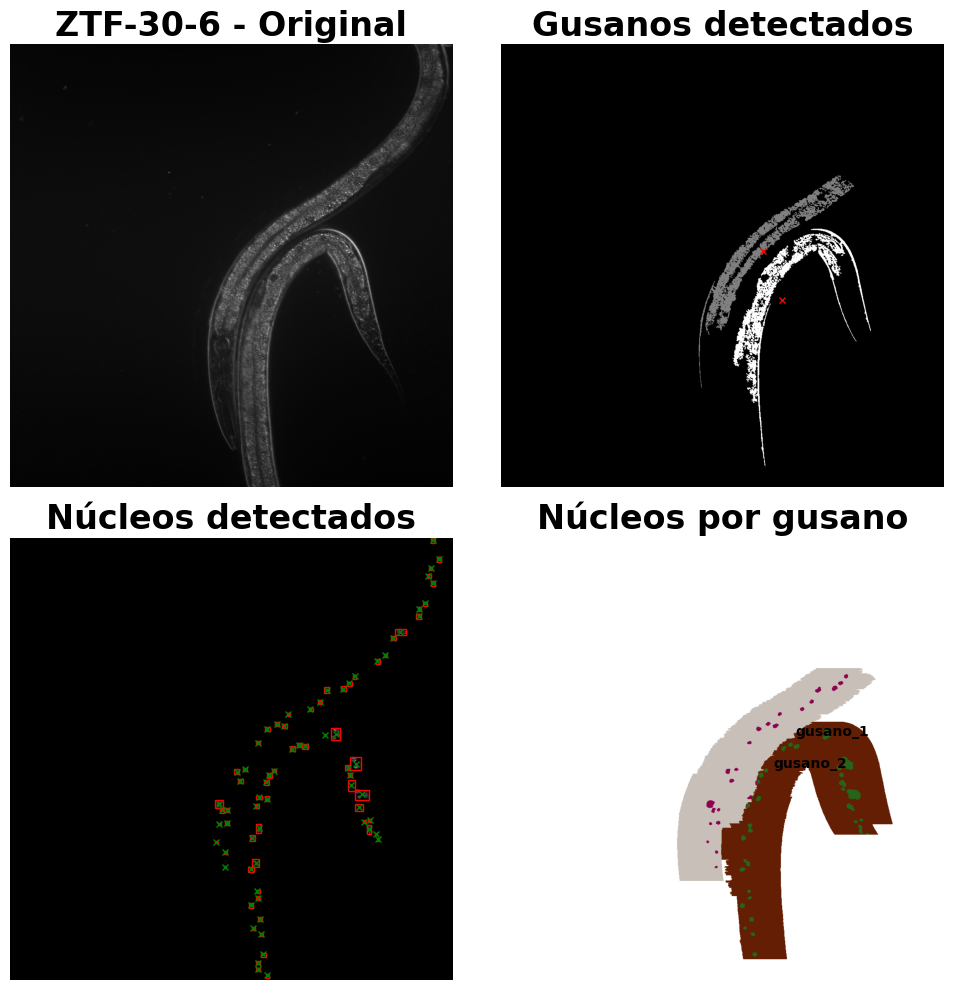

06:39:39.566 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 7.ids
06:39:39.566 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 7.ids
06:39:39.566 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 7.ids)
06:39:39.566 [main] INFO loci.formats.FormatHandler - Finding companion file
06:39:39.566 [main] INFO loci.formats.FormatHandler - Checking file version
06:39:39.569 [main] INFO loci.formats.FormatHandler - Reading metadata
06:39:39.661 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Float

/tmp/ipykernel_278/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


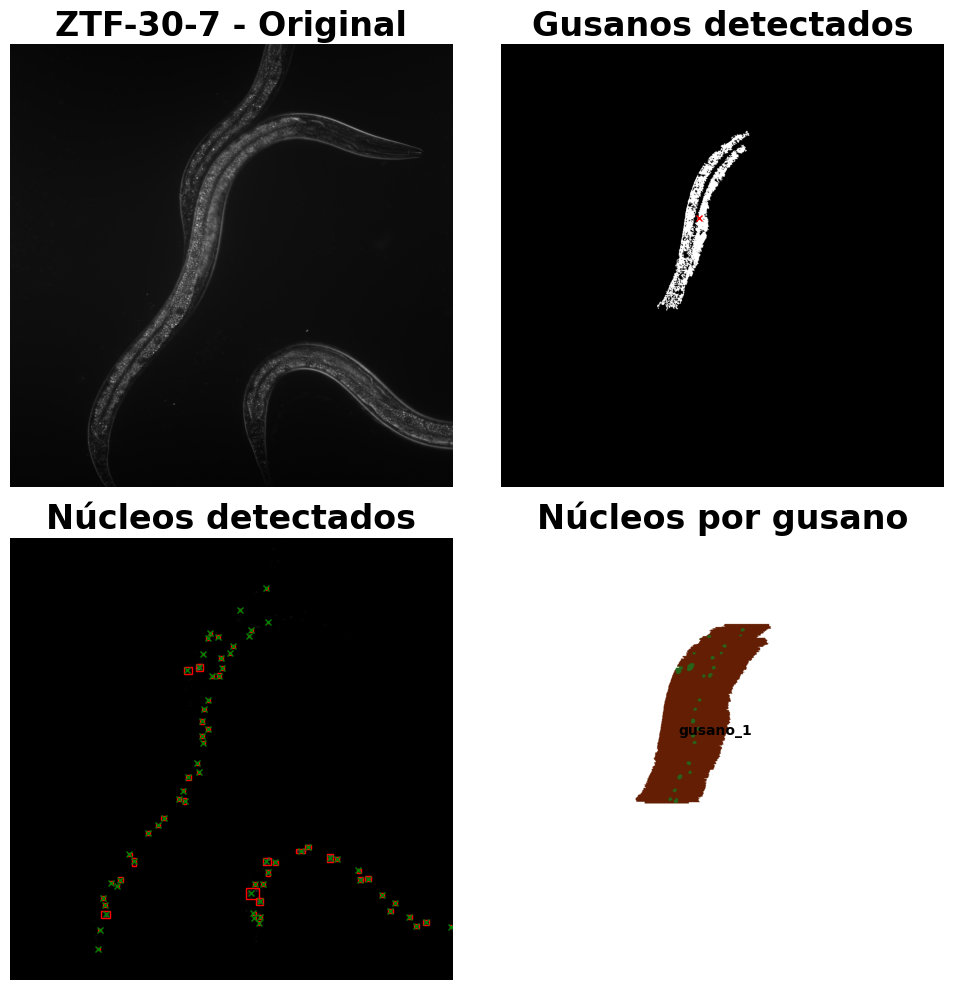

06:40:18.217 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 8.ids
06:40:18.217 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 8.ids
06:40:18.217 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 8.ids)
06:40:18.217 [main] INFO loci.formats.FormatHandler - Finding companion file
06:40:18.217 [main] INFO loci.formats.FormatHandler - Checking file version
06:40:18.219 [main] INFO loci.formats.FormatHandler - Reading metadata
06:40:18.286 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Float

/tmp/ipykernel_278/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


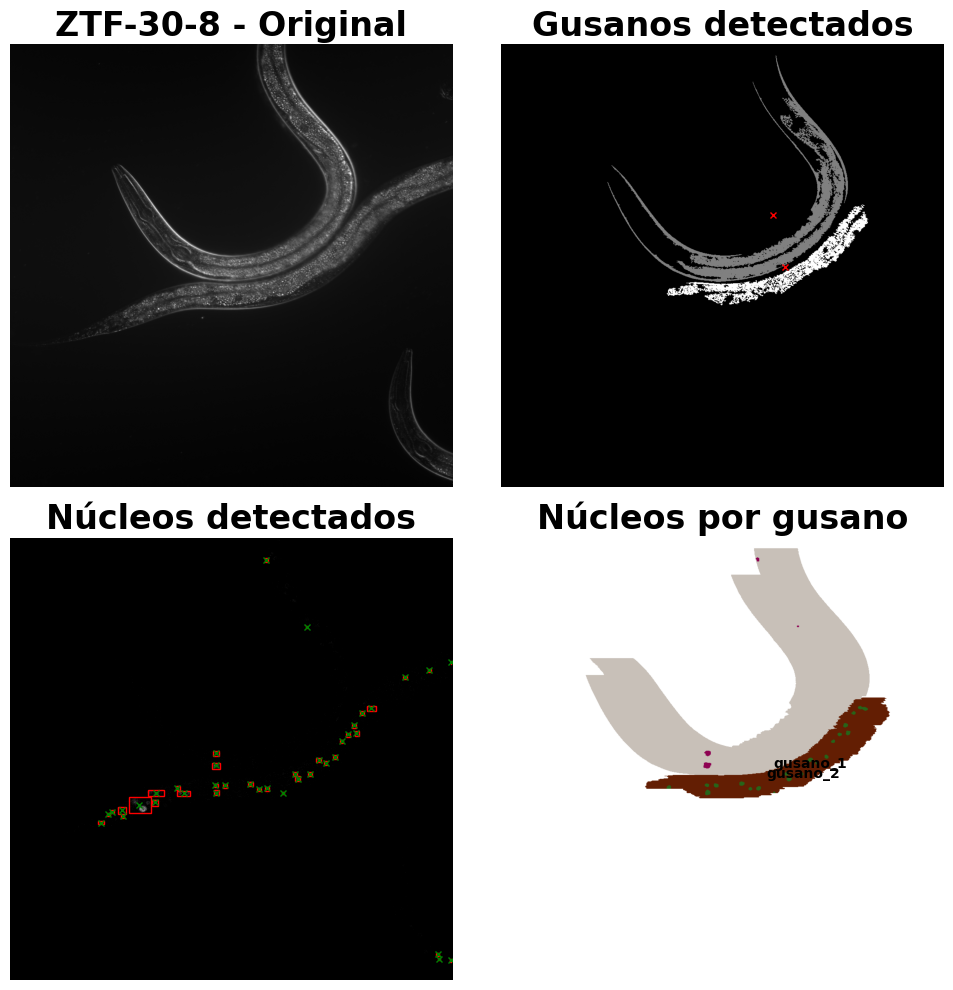

Se elimino el gusano gusano_1
06:40:55.944 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 9.ids
06:40:55.944 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 9.ids
06:40:55.944 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 9.ids)
06:40:55.944 [main] INFO loci.formats.FormatHandler - Finding companion file
06:40:55.945 [main] INFO loci.formats.FormatHandler - Checking file version
06:40:55.947 [main] INFO loci.formats.FormatHandler - Reading metadata
06:40:56.006 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at jav

/tmp/ipykernel_278/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


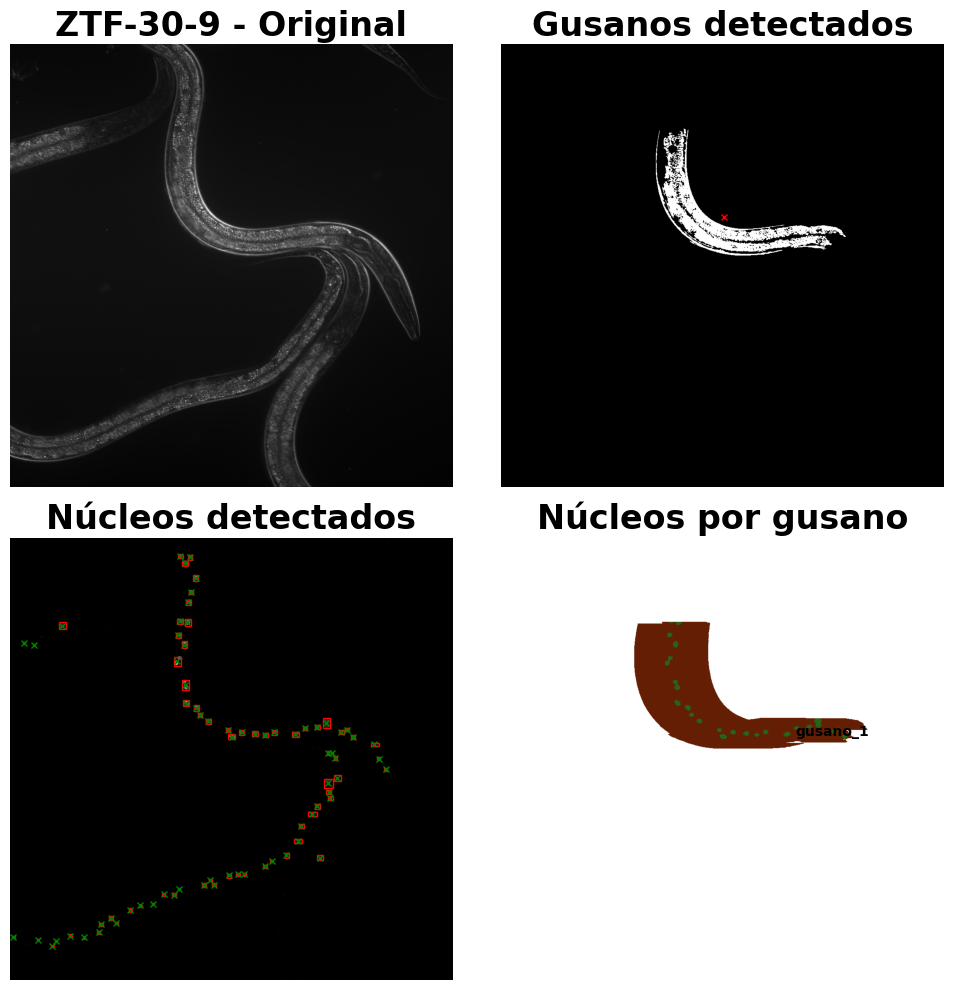

06:41:34.652 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 10.ids
06:41:34.652 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 10.ids
06:41:34.652 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 10.ids)
06:41:34.652 [main] INFO loci.formats.FormatHandler - Finding companion file
06:41:34.652 [main] INFO loci.formats.FormatHandler - Checking file version
06:41:34.654 [main] INFO loci.formats.FormatHandler - Reading metadata
06:41:34.715 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Fl

/tmp/ipykernel_278/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


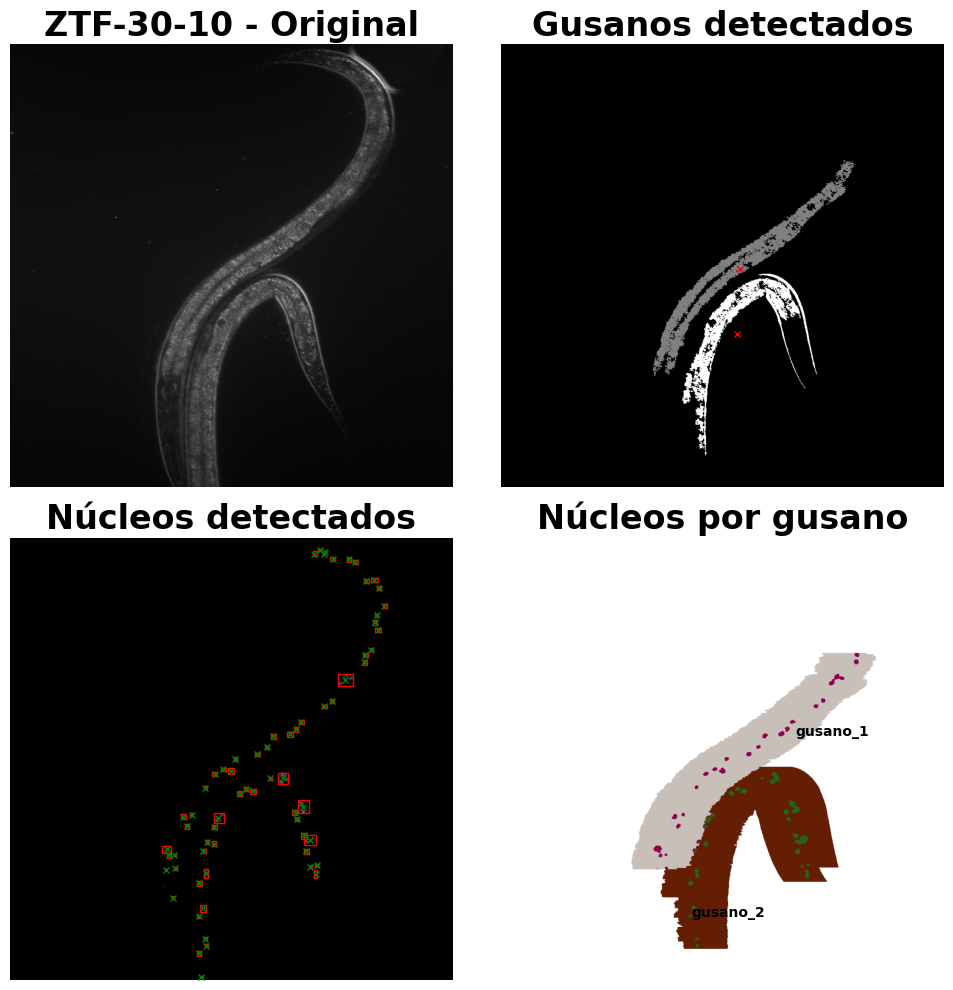

In [98]:
wormTrackers_ztf_30 = []
for ruta in rutas_completas:
    wormTrackers_ztf_30.append(WormTracker(ruta))

estadisticas_fluorescencias_ztf_30 = {}
i = 1
for tracker in wormTrackers_ztf_30:
    tracker.procesarImagen(thresholdCampoClaro=0.275, thresholdFluo=0.05) # Cambio a menor threshold
    tracker.buscarNucleos(tol_cerrada = 5, tol_abierta = 5) # cambio tol cerrada
    tracker.coordenadasDeNucleos()
    tracker.centroidesDeNucleos()
    tracker.buscarGusanos(iteraciones=8, con_rellenado_inundacion=False,
                        min_area=3500, tol_rellenado_1=3, tol_rellenado_2=1, max_iteracion=10) 
    tracker.coordenadasDeGusanos()
    tracker.interseccionGusanoNucleos()
    tracker.graficarProcesamiento(modos=[0, 1, 3, 4], titulo=f"ZTF-30-{i}")
    tracker.fluorescencia_de_nucleos()
    tracker.filtrar_por_cantidad_nucleos()
    _, _, estadisticas = tracker.eliminar_outliers()
    estadisticas_fluorescencias_ztf_30[f"ZTF-30-{i}"] = estadisticas
    i += 1

06:42:13.457 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 3.ids
06:42:13.457 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 3.ids
06:42:13.458 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 3.ids)
06:42:13.458 [main] INFO loci.formats.FormatHandler - Finding companion file
06:42:13.458 [main] INFO loci.formats.FormatHandler - Checking file version
06:42:13.461 [main] INFO loci.formats.FormatHandler - Reading metadata
06:42:13.547 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Float

/tmp/ipykernel_278/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


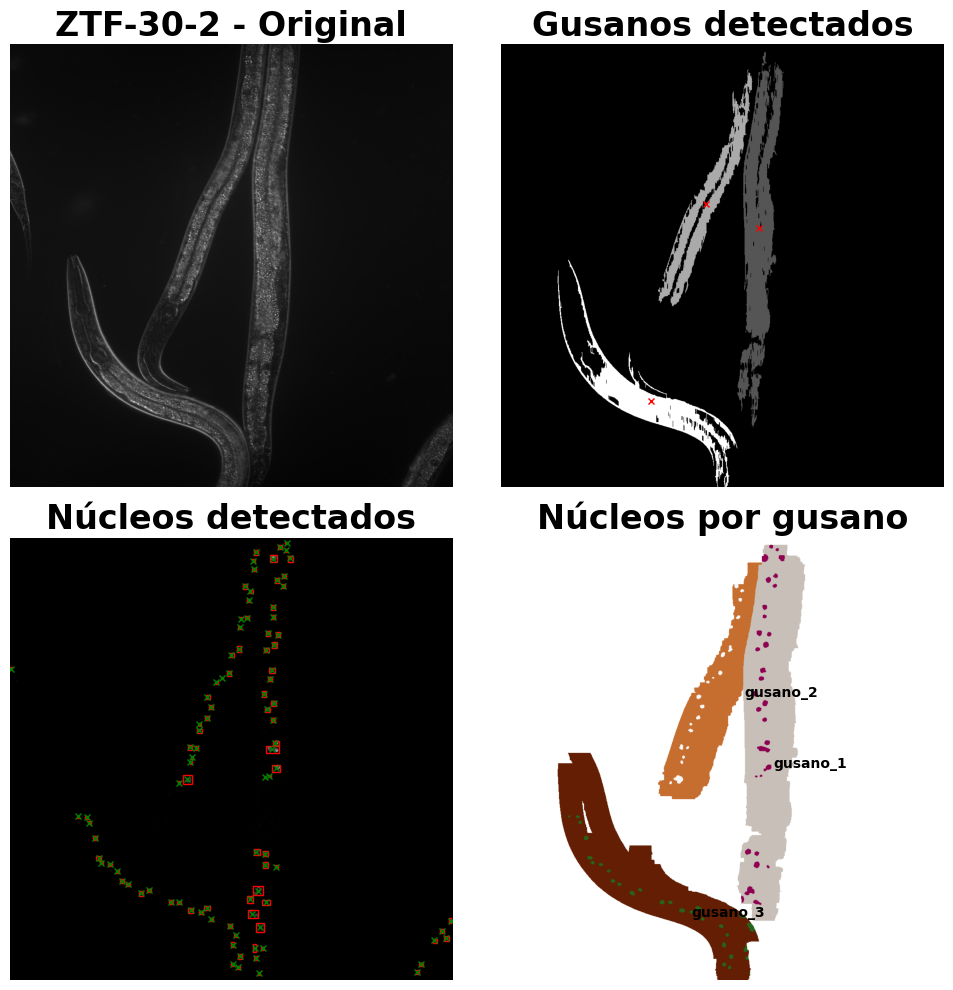

In [99]:
wormTrackers_ztf_30[2].procesarImagen(thresholdCampoClaro=0.25, thresholdFluo=0.05) # Cambio a menor threshold
wormTrackers_ztf_30[2].buscarNucleos(tol_cerrada = 5, tol_abierta = 5) # cambio tol cerrada
wormTrackers_ztf_30[2].coordenadasDeNucleos()
wormTrackers_ztf_30[2].centroidesDeNucleos()
wormTrackers_ztf_30[2].buscarGusanos(tol_cerrada_1 = 1, tol_cerrada_2 = 2, iteraciones=8, con_rellenado_inundacion=False,
                        min_area=1500, tol_rellenado_1=2, tol_rellenado_2=1, max_iteracion=10) 
wormTrackers_ztf_30[2].coordenadasDeGusanos()
wormTrackers_ztf_30[2].interseccionGusanoNucleos()
wormTrackers_ztf_30[2].graficarProcesamiento(modos=[0, 1, 3, 4], titulo="ZTF-30-2")
wormTrackers_ztf_30[2].fluorescencia_de_nucleos()
wormTrackers_ztf_30[2].filtrar_por_cantidad_nucleos()
_, _, estadisticas = wormTrackers_ztf_30[2].eliminar_outliers()
estadisticas_fluorescencias_ztf_30["ZTF-30-2"] = estadisticas

06:42:46.478 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 4.ids
06:42:46.478 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 4.ids
06:42:46.478 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 4.ids)
06:42:46.478 [main] INFO loci.formats.FormatHandler - Finding companion file
06:42:46.478 [main] INFO loci.formats.FormatHandler - Checking file version
06:42:46.482 [main] INFO loci.formats.FormatHandler - Reading metadata
06:42:46.557 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Float

/tmp/ipykernel_278/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


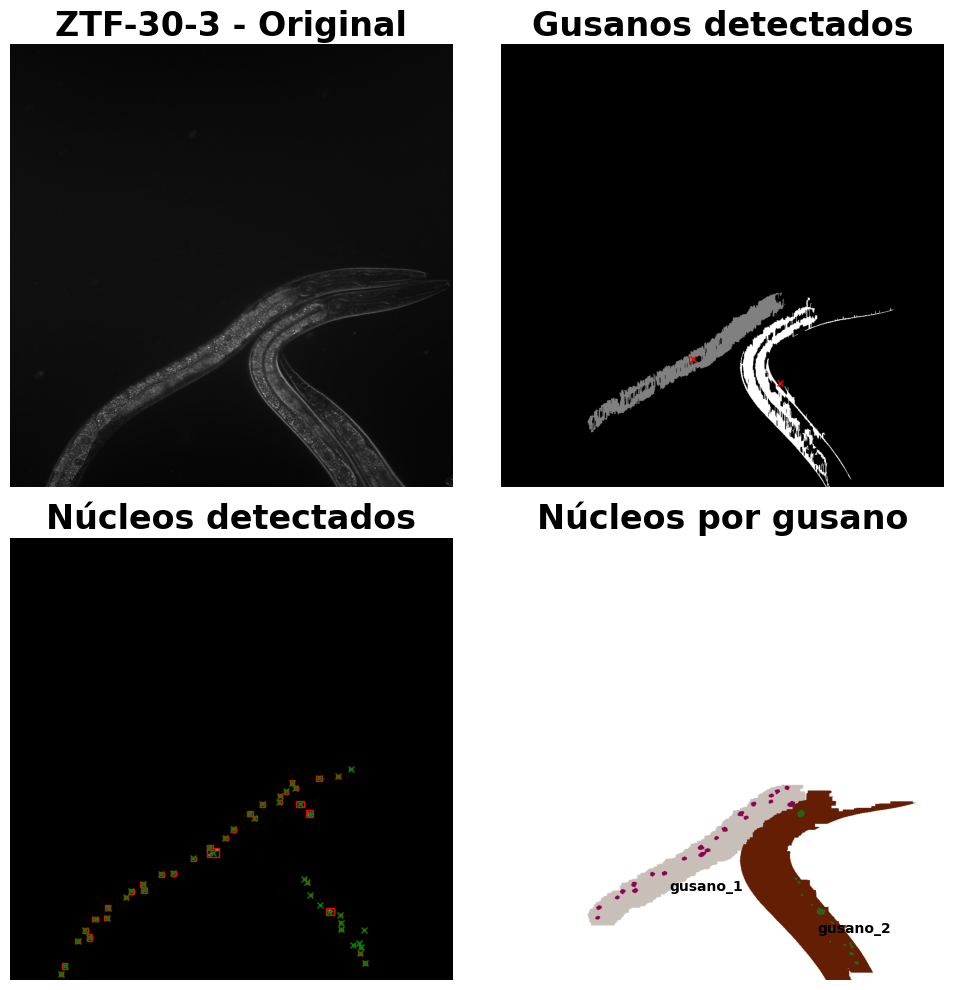

Se elimino el gusano gusano_2


In [100]:
wormTrackers_ztf_30[3].procesarImagen(thresholdCampoClaro=0.25, thresholdFluo=0.05) # Cambio a menor threshold
wormTrackers_ztf_30[3].buscarNucleos(tol_cerrada = 5, tol_abierta = 5) # cambio tol cerrada
wormTrackers_ztf_30[3].coordenadasDeNucleos()
wormTrackers_ztf_30[3].centroidesDeNucleos()
wormTrackers_ztf_30[3].buscarGusanos(tol_cerrada_1 = 1, tol_cerrada_2 = 2, iteraciones=8, con_rellenado_inundacion=False,
                        min_area=2500, tol_rellenado_1=2, tol_rellenado_2=1, max_iteracion=10) 
wormTrackers_ztf_30[3].coordenadasDeGusanos()
wormTrackers_ztf_30[3].interseccionGusanoNucleos()
wormTrackers_ztf_30[3].graficarProcesamiento(modos=[0, 1, 3, 4], titulo="ZTF-30-3")
wormTrackers_ztf_30[3].fluorescencia_de_nucleos()
wormTrackers_ztf_30[3].filtrar_por_cantidad_nucleos()
_, _, estadisticas = wormTrackers_ztf_30[3].eliminar_outliers()
estadisticas_fluorescencias_ztf_30["ZTF-30-3"] = estadisticas

06:43:18.597 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 5.ids
06:43:18.597 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 5.ids
06:43:18.597 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 5.ids)
06:43:18.597 [main] INFO loci.formats.FormatHandler - Finding companion file
06:43:18.597 [main] INFO loci.formats.FormatHandler - Checking file version
06:43:18.630 [main] INFO loci.formats.FormatHandler - Reading metadata
06:43:18.701 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Float

/tmp/ipykernel_278/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


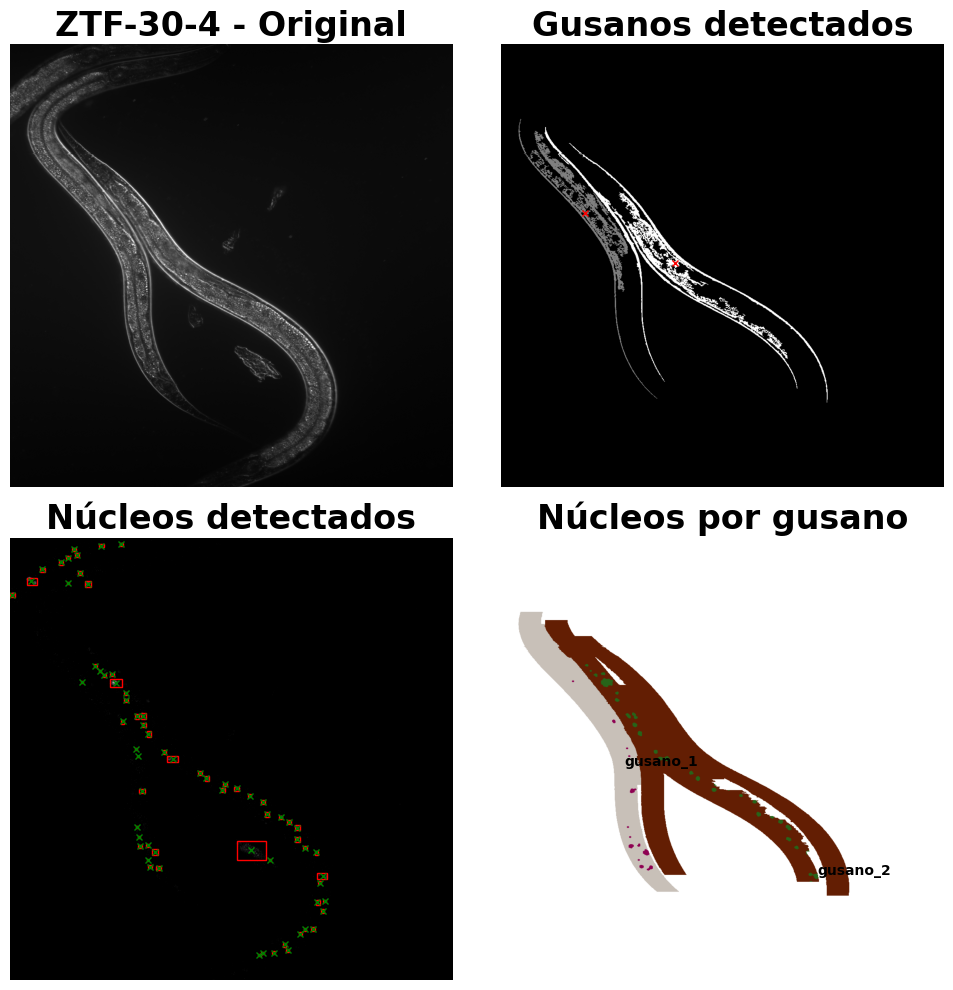

Se elimino el gusano gusano_1


In [101]:
wormTrackers_ztf_30[4].procesarImagen(thresholdCampoClaro=0.32, thresholdFluo=0.05) # Cambio a menor threshold
wormTrackers_ztf_30[4].buscarNucleos(tol_cerrada = 5, tol_abierta = 5) # cambio tol cerrada
wormTrackers_ztf_30[4].coordenadasDeNucleos()
wormTrackers_ztf_30[4].centroidesDeNucleos()
wormTrackers_ztf_30[4].buscarGusanos(tol_cerrada_1 = 2, tol_cerrada_2=1, iteraciones=8, con_rellenado_inundacion=False,
                        min_area=3500, tol_rellenado_1=2, tol_rellenado_2=1, max_iteracion=10) 
wormTrackers_ztf_30[4].coordenadasDeGusanos()
wormTrackers_ztf_30[4].interseccionGusanoNucleos()
wormTrackers_ztf_30[4].graficarProcesamiento(modos=[0, 1, 3, 4], titulo="ZTF-30-4")
wormTrackers_ztf_30[4].fluorescencia_de_nucleos()
wormTrackers_ztf_30[4].filtrar_por_cantidad_nucleos()
_, _, estadisticas = wormTrackers_ztf_30[4].eliminar_outliers()
estadisticas_fluorescencias_ztf_30["ZTF-30-4"] = estadisticas

06:43:44.395 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 9.ids
06:43:44.395 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 9.ids
06:43:44.395 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 9.ids)
06:43:44.395 [main] INFO loci.formats.FormatHandler - Finding companion file
06:43:44.395 [main] INFO loci.formats.FormatHandler - Checking file version
06:43:44.396 [main] INFO loci.formats.FormatHandler - Reading metadata
06:43:44.415 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Float

/tmp/ipykernel_278/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


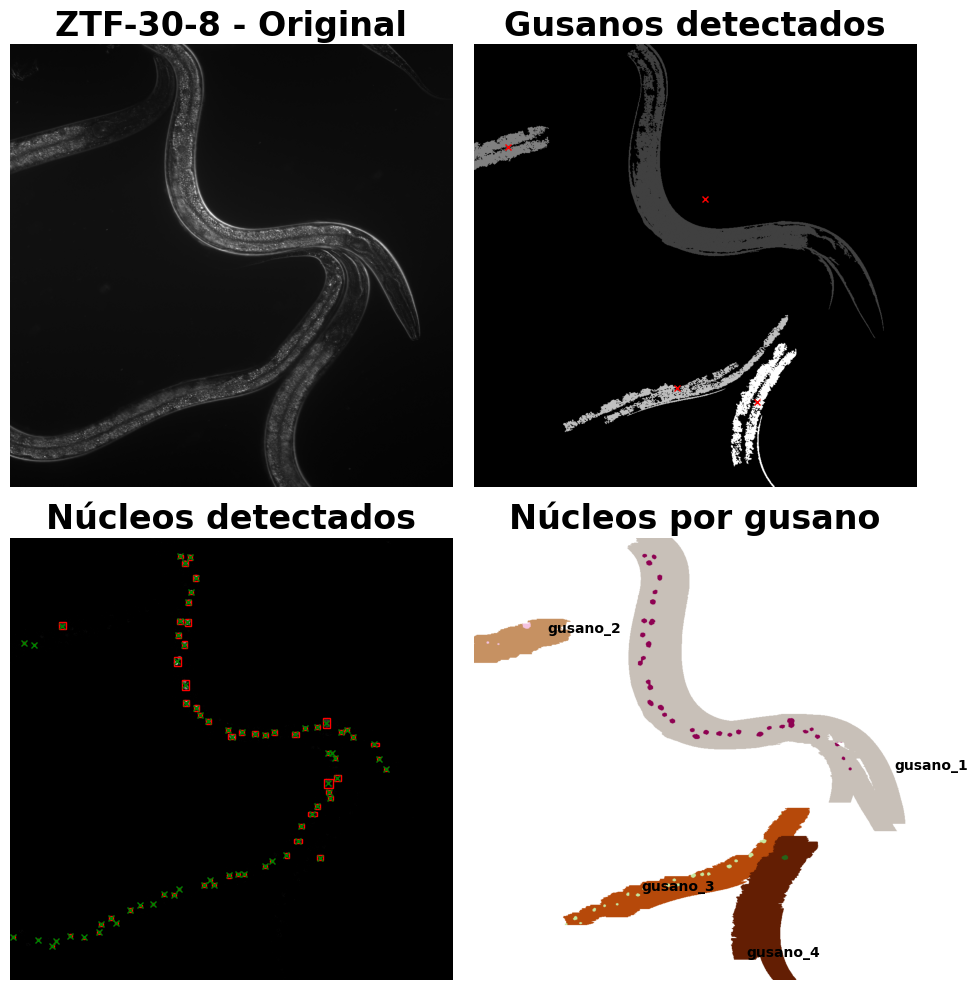

Se elimino el gusano gusano_2
Se elimino el gusano gusano_4


In [102]:
wormTrackers_ztf_30[8].procesarImagen(thresholdCampoClaro=0.20, thresholdFluo=0.05) # Cambio a menor threshold
wormTrackers_ztf_30[8].buscarNucleos(tol_cerrada = 5, tol_abierta = 5) # cambio tol cerrada
wormTrackers_ztf_30[8].coordenadasDeNucleos()
wormTrackers_ztf_30[8].centroidesDeNucleos()
wormTrackers_ztf_30[8].buscarGusanos(iteraciones=8, con_rellenado_inundacion=False,
                        min_area=3500, tol_rellenado_1=2, tol_rellenado_2=1, max_iteracion=10) 
wormTrackers_ztf_30[8].coordenadasDeGusanos()
wormTrackers_ztf_30[8].interseccionGusanoNucleos()
wormTrackers_ztf_30[8].graficarProcesamiento(modos=[0, 1, 3, 4], titulo="ZTF-30-8")
wormTrackers_ztf_30[8].fluorescencia_de_nucleos()
wormTrackers_ztf_30[8].filtrar_por_cantidad_nucleos()
_, _, estadisticas = wormTrackers_ztf_30[8].eliminar_outliers()
estadisticas_fluorescencias_ztf_30["ZTF-30-8"] = estadisticas

06:44:13.892 [main] INFO loci.formats.ImageReader - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 7.ids
06:44:13.892 [main] DEBUG loci.formats.FormatHandler - ICSReader initializing /home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 7.ids
06:44:13.892 [main] DEBUG loci.formats.FormatHandler - loci.formats.in.ICSReader.initFile(/home/nephelim/Descargas/Radsmad_C_elegans/RADSMAD ztf30/RADSMAD ztf30 7.ids)
06:44:13.892 [main] INFO loci.formats.FormatHandler - Finding companion file
06:44:13.892 [main] INFO loci.formats.FormatHandler - Checking file version
06:44:13.894 [main] INFO loci.formats.FormatHandler - Reading metadata
06:44:13.939 [main] DEBUG loci.formats.FormatHandler - Could not parse double value 'Confocal C1 Scanner'
java.lang.NumberFormatException: For input string: "Confocal C1 Scanner"
	at java.base/jdk.internal.math.FloatingDecimal.readJavaFormatString(Unknown Source)
	at java.base/jdk.internal.math.Float

/tmp/ipykernel_278/1917679009.py:155: RuntimeWarning: invalid value encountered in divide
  matriz_img_norm = imgMatriz / imgMatriz.max()


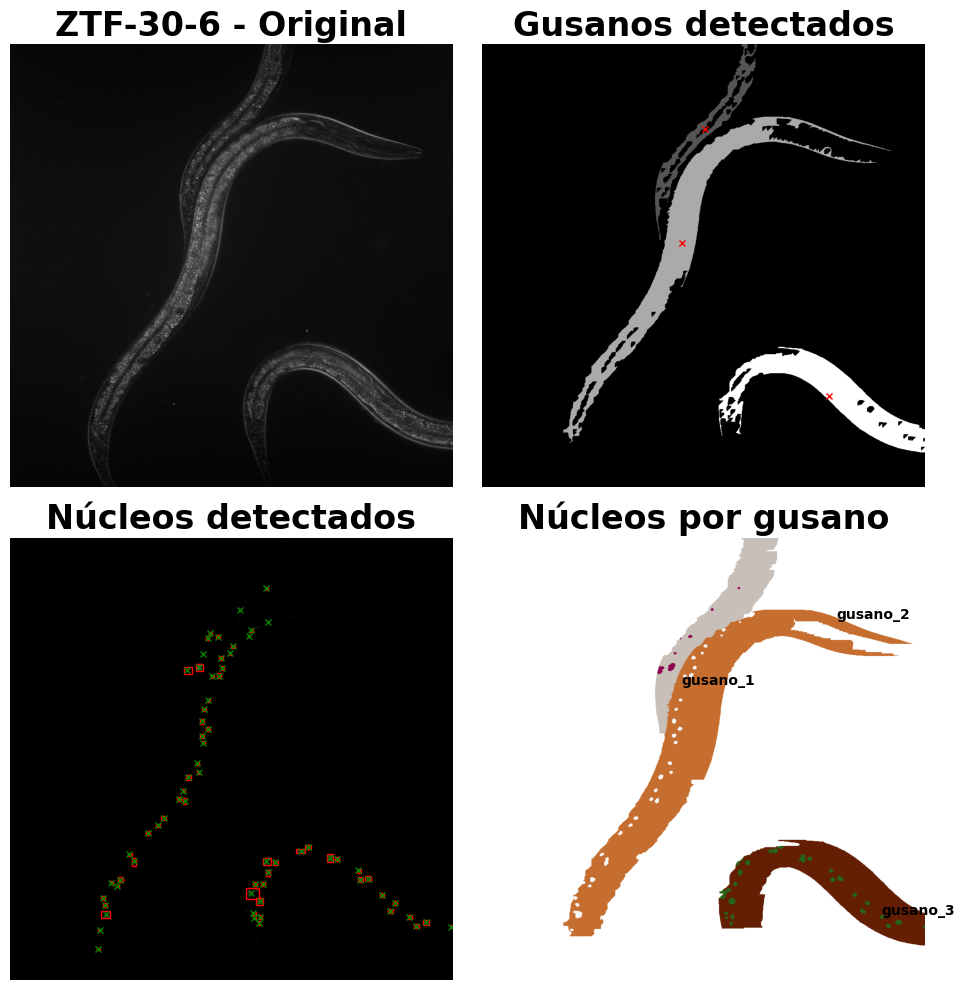

Se elimino el gusano gusano_1


In [103]:
wormTrackers_ztf_30[6].procesarImagen(thresholdCampoClaro=0.20, thresholdFluo=0.05) # Cambio a menor threshold
wormTrackers_ztf_30[6].buscarNucleos(tol_cerrada = 5, tol_abierta = 5) # cambio tol cerrada
wormTrackers_ztf_30[6].coordenadasDeNucleos()
wormTrackers_ztf_30[6].centroidesDeNucleos()
wormTrackers_ztf_30[6].buscarGusanos(tol_cerrada_1 = 2, tol_cerrada_2 = 2, iteraciones=8, con_rellenado_inundacion=False,
                        min_area=1000, tol_rellenado_1=2, tol_rellenado_2=1, max_iteracion=10) 
wormTrackers_ztf_30[6].coordenadasDeGusanos()
wormTrackers_ztf_30[6].interseccionGusanoNucleos()
wormTrackers_ztf_30[6].graficarProcesamiento(modos=[0, 1, 3, 4], titulo="ZTF-30-6")
wormTrackers_ztf_30[6].fluorescencia_de_nucleos()
wormTrackers_ztf_30[6].filtrar_por_cantidad_nucleos()
_, _, estadisticas = wormTrackers_ztf_30[6].eliminar_outliers()
estadisticas_fluorescencias_ztf_30["ZTF-30-6"] = estadisticas

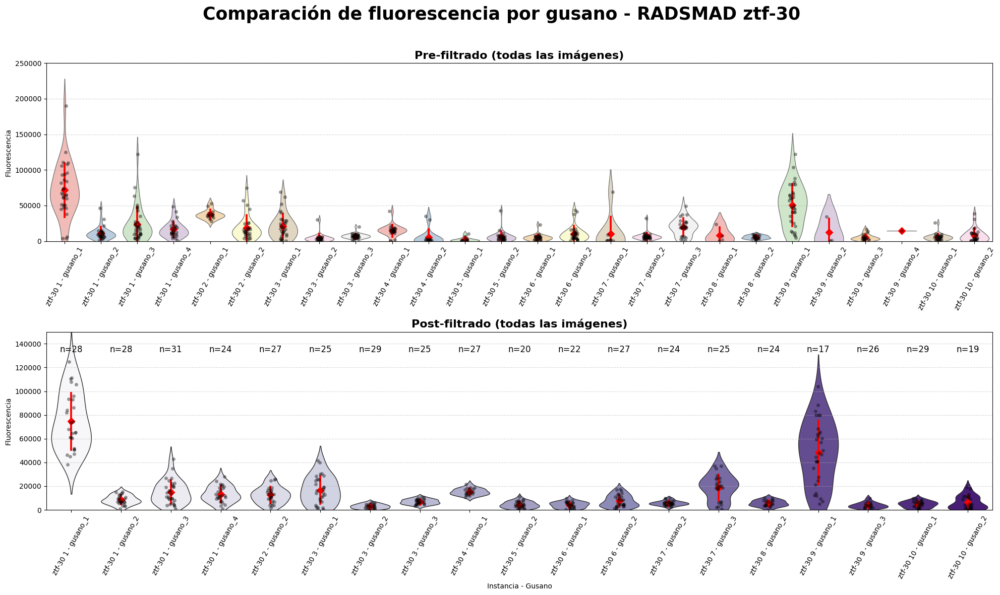

In [104]:
radsmad_ztf_30_violin = graficar_violin_outliers_multiple(wormTrackers=wormTrackers_ztf_30, 
                                                    titulo="Comparación de fluorescencia por gusano - RADSMAD ztf-30",
                                                    ylim_pre=(0, 250000), 
                                                    ylim_post=(0,150000),
                                                    label="ztf-30")

In [191]:
ruta_output_ztf_30 = "/home/nephelim/Documentos/Investigacion/BioPictureTools/output/ztf_30/"

figuras_analisis_gusanos_ztf_30 = []
for tracker in wormTrackers_ztf_30:
    figuras_analisis_gusanos_ztf_30.append(tracker.figuraGusanos)

i = 1
for figura in figuras_analisis_gusanos_ztf_30:
    figura.savefig(ruta_output_ztf_30 + f"RADSMAD_ztf_30_{i}", dpi=300, bbox_inches="tight")
    i += 1

In [105]:
dataFrame_ztf_30_estadisticas = convertir_estadisticas_a_dataFrame(estadisticas_fluorescencias_ztf_30, genotipo="ZTF-30")
dataFrame_ztf_30_fluo = convertir_fluorescencias_a_dataFrame(wormTrackers_ztf_30, genotipo="ztf-30")
dataFrame_ztf_30_estadisticas

,gusano_id,media,mediana,sigma,cv
0,ZTF-30-1_gusano_1,74718.074074,67840.0,24001.414764,0.321226
1,ZTF-30-1_gusano_2,8415.208333,7539.5,3908.148566,0.464415
2,ZTF-30-1_gusano_3,14977.241379,13417.0,10064.646714,0.671996
3,ZTF-30-1_gusano_4,13339.240000,12091.0,6900.199655,0.517286
4,ZTF-30-2_gusano_1,16696.464286,15267.0,11787.985005,0.706017
5,ZTF-30-2_gusano_2,3069.272727,2987.0,1896.628542,0.617941
6,ZTF-30-2_gusano_3,6941.153846,6490.0,2164.672644,0.311861
7,ZTF-30-3_gusano_1,15341.947368,15075.0,2788.917462,0.181784
8,ZTF-30-4_gusano_2,4428.740741,4101.0,2762.362319,0.623735
9,ZTF-30-5_gusano_1,4032.571429,3621.5,3158.534317,0.783256


In [106]:
dataFrame_ztf_30_estadisticas.to_excel("estadisticas_gusanos_ztf_30.xlsx", index=False)
dataFrame_ztf_30_fluo.to_excel("fluorescencia_nucleos_gusanos_ztf_30.xlsx", index=False)

In [ ]:
def raincloud_plot(wormTrackers_dict, post=False, titulo="Distribución de fluorescencia por condición"):
    """
    Genera un raincloud plot comparando condiciones (WT, ztf-30, lon-2).
    
    Parameters
    ----------
    wormTrackers_dict : dict
        Diccionario con etiquetas como keys (e.g., {"WT": lista_wt, "ztf-30": lista_ztf, "lon-2": lista_lon})
        y listas de instancias WormTracker como valores.
    post : bool
        Si True, usa fluorescencias post-filtrado (fluorescenciasPorGusanoCorregido).
    titulo : str
        Título del gráfico.
    """
    
    # ---- Preparar datos en formato tidy ----
    data = []
    for label, trackers in wormTrackers_dict.items():
        for idx, tracker in enumerate(trackers):
            dicc = tracker.fluorescenciasPorGusanoCorregido if post else tracker.fluorescenciasPorGusano
            instancia = getattr(tracker, "nombre", f"{label} {idx+1}")
            for gusano, nucleos in dicc.items():
                for _, val in nucleos.items():
                    data.append({
                        "Condición": label,
                        "Gusano": f"{instancia}-{gusano}",
                        "Fluorescencia": val
                    })

    import pandas as pd
    df = pd.DataFrame(data)

    # ---- Plot ----
    plt.figure(figsize=(10,6))
    sns.violinplot(data=df, x="Condición", y="Fluorescencia", inner=None, 
                   linewidth=1, cut=0, palette="Set2")  # Distribución global
    
    sns.boxplot(data=df, x="Condición", y="Fluorescencia", 
                width=0.2, showcaps=True, boxprops={'facecolor':'white', "zorder":3},
                showfliers=False, whiskerprops={'linewidth':2}, zorder=2)  # Mediana + IQR
    
    sns.stripplot(data=df, x="Condición", y="Fluorescencia", 
                  jitter=True, color="black", size=3, alpha=0.5, zorder=1)  # Puntos individuales

    plt.title(titulo, fontsize=16, fontweight="bold")
    plt.ylabel("Intensidad de fluorescencia", fontsize=13)
    plt.xlabel("Condición", fontsize=13)
    plt.grid(axis="y", linestyle="--", alpha=0.5)

    plt.tight_layout()
    plt.show()


/tmp/ipykernel_448/2329961324.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x="Condición", y="Fluorescencia", inner=None,


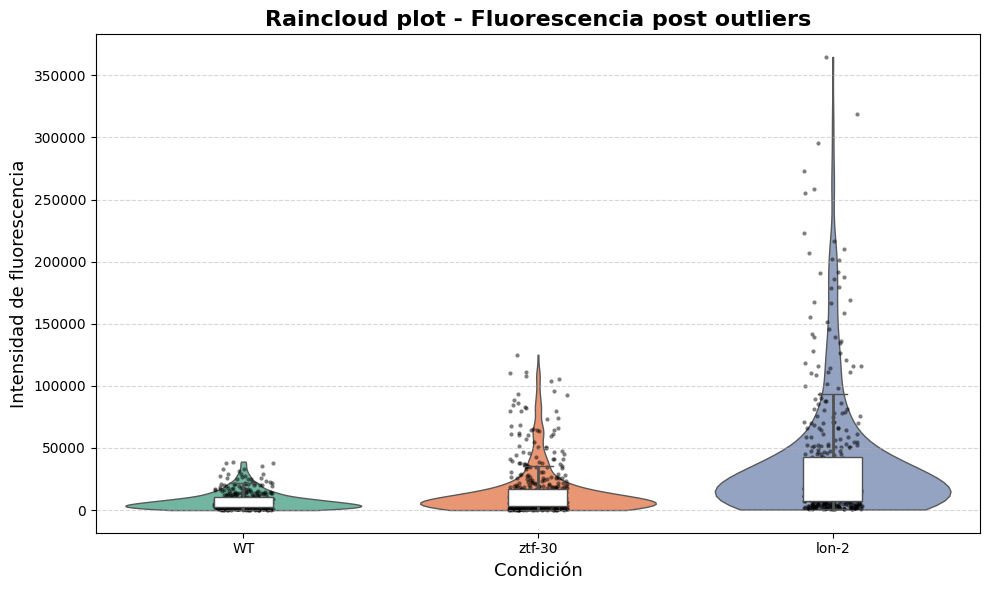

In [ ]:
raincloud_plot({
    "WT": wormTrackers,
    "ztf-30": wormTrackers_ztf_30,
    "lon-2": wormTrackers_lon_2
}, post=True, titulo="Raincloud plot - Fluorescencia post outliers")

In [162]:
df_datos_combinado = pd.concat([dataFrame_WT_estadisticas, dataFrame_lon_2_estadisticas, dataFrame_ztf_30_estadisticas], ignore_index= True)
df_datos_combinado

,gusano_id,media,mediana,sigma,cv,Genotipo
0,WT-1_gusano_1,16378.230769,14911.0,10102.314418,0.616814,WT
1,WT-2_gusano_1,2142.777778,2326.0,1327.463462,0.619506,WT
2,WT-3_gusano_1,9676.342857,5981.0,9802.620916,1.013050,WT
3,WT-4_gusano_1,4232.428571,4192.5,1227.992201,0.290139,WT
4,WT-5_gusano_1,4603.636364,4454.0,3374.618662,0.733033,WT
5,WT-6_gusano_1,6945.423077,6950.5,2195.222926,0.316068,WT
6,WT-6_gusano_2,9877.894737,9330.0,4084.784163,0.413528,WT
7,WT-7_gusano_1,9978.444444,9429.0,3686.699723,0.369466,WT
8,WT-7_gusano_2,9447.318182,8796.0,4924.290177,0.521237,WT
9,WT-8_gusano_1,5779.000000,5228.5,4111.778416,0.711503,WT


In [163]:
from sklearn.preprocessing import StandardScaler

features = ['media', 'cv', 'sigma'] # Puedes ajustar qué métricas incluir
X = df_datos_combinado[features]

# Inicializar y aplicar el estandarizador (Z-score)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Opcional: convertir de vuelta a DataFrame para inspección
df_scaled = pd.DataFrame(X_scaled, columns=[f'{f}_scaled' for f in features])

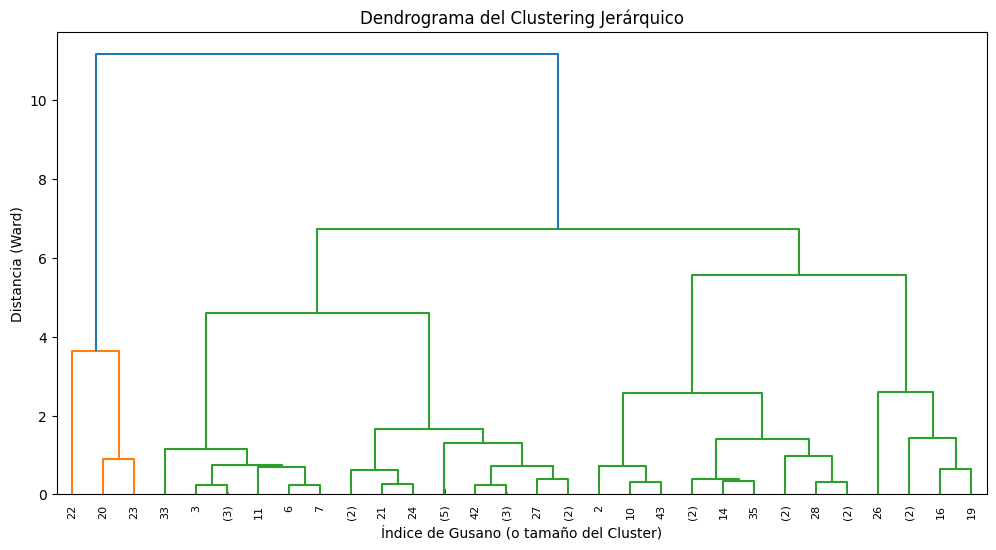

In [164]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt

# 1. Crear la matriz de enlace (Linkage Matrix)
# Usamos 'ward' que minimiza la varianza dentro de cada cluster
Z = linkage(X_scaled, method='ward')

# 2. Visualizar el Dendrograma (Opcional, pero muy informativo)
plt.figure(figsize=(12, 6))
dendrogram(Z,
           truncate_mode='lastp',  # Muestra solo los últimos p clusters unidos
           p=30,                   # Número de uniones a mostrar
           leaf_rotation=90.,
           leaf_font_size=8.,
           show_contracted=True)
plt.title('Dendrograma del Clustering Jerárquico')
plt.xlabel('Índice de Gusano (o tamaño del Cluster)')
plt.ylabel('Distancia (Ward)')
plt.show() # 

# 3. Aplicar el Clustering con el número de clusters (n_clusters = 3)
n_clusters = 4
agg_cluster = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
df_datos_combinado['Cluster_H'] = agg_cluster.fit_predict(X_scaled)

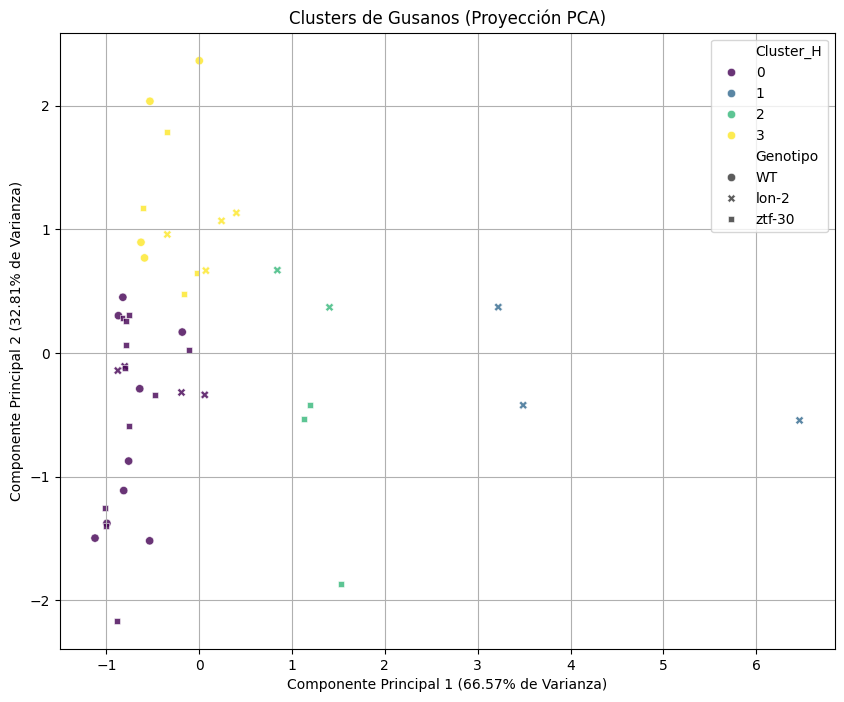

In [165]:
from sklearn.decomposition import PCA
import seaborn as sns

# 1. Aplicar PCA a los datos estandarizados
pca = PCA(n_components=2)
principal_components = pca.fit_transform(X_scaled)

# 2. Crear un DataFrame con los componentes y la información de clustering/genotipo
df_pca = pd.DataFrame(data = principal_components, columns = ['PC1', 'PC2'])
df_pca['Cluster_H'] = df_datos_combinado['Cluster_H']
df_pca['Genotipo'] = df_datos_combinado['Genotipo'] # Añadir genotipo para colorear/separar

# 3. Graficar los clusters en el espacio 2D de PCA
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x='PC1', 
    y='PC2', 
    hue='Cluster_H',        # Color según el Cluster
    style='Genotipo',       # Estilo de marcador según el Genotipo
    data=df_pca, 
    palette='viridis',      # Escala de colores
    legend='full',
    alpha=0.8
)

# Etiquetar los ejes
plt.title('Clusters de Gusanos (Proyección PCA)')
plt.xlabel(f'Componente Principal 1 ({pca.explained_variance_ratio_[0]*100:.2f}% de Varianza)')
plt.ylabel(f'Componente Principal 2 ({pca.explained_variance_ratio_[1]*100:.2f}% de Varianza)')
plt.grid(True)
plt.show()

In [166]:
print(df_datos_combinado.groupby('Cluster_H')[['media', 'cv', 'sigma']].mean())

                   media        cv         sigma
Cluster_H                                       
0            9318.640811  0.485112   4366.592200
1          104043.480664  0.685547  70981.830169
2           49636.337438  0.568801  26298.237233
3           11112.083237  0.793162   8595.724820


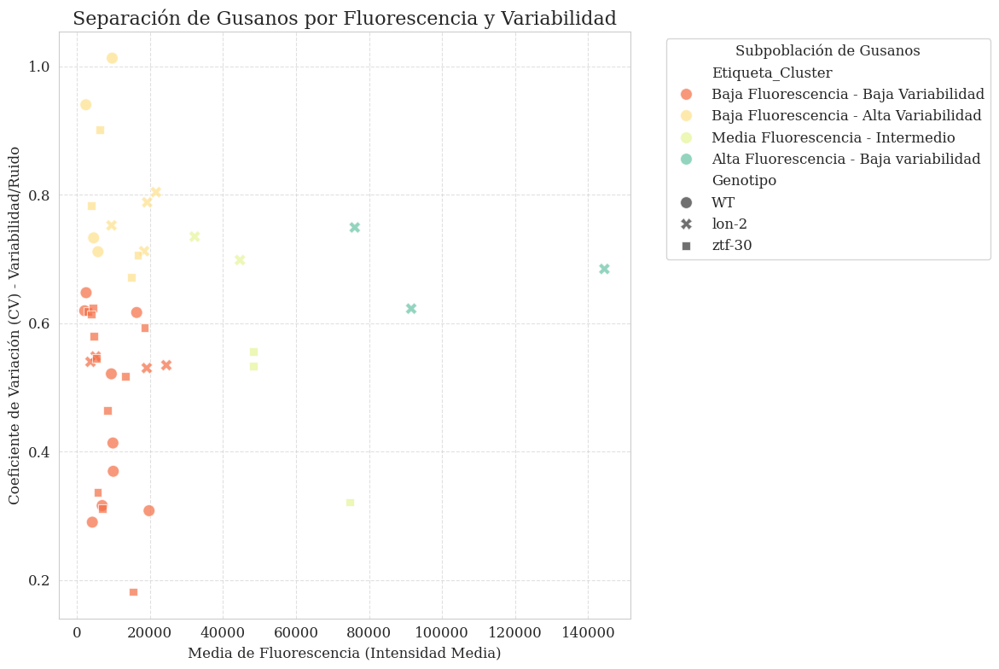

In [188]:
# Mapeo de Clusters a Etiquetas Conceptuales (Ajustar según tu análisis de medias)
# **Importante:** Debes reemplazar estos nombres por las etiquetas que te dio el análisis
# de la media y el CV por cluster (e.g., 0: Baja, 1: Alta, 2: Variable).
df = df_datos_combinado

cluster_map = {
    0: 'Baja Fluorescencia - Baja Variabilidad',
    1: 'Alta Fluorescencia - Baja variabilidad',
    2: 'Media Fluorescencia - Intermedio',
    3: 'Baja Fluorescencia - Alta Variabilidad'
}
df['Etiqueta_Cluster'] = df['Cluster_H'].map(cluster_map)

# 1. Gráfico de dispersión (Scatter Plot)
plt.figure(figsize=(12, 8))
scatter = sns.scatterplot(
    x='media',                         # Eje X: Media de Fluorescencia (Intensidad)
    y='cv',                            # Eje Y: Coeficiente de Variación (Dispersión/Consistencia)
    hue='Etiqueta_Cluster',            # Color: Por la etiqueta conceptual del Cluster
    style='Genotipo',                  # Estilo de marcador: Por Genotipo (WT, lon-2, etc.)
    data=df,
    palette='Spectral',                # Usa una paleta de colores distintiva
    s=100,                             # Tamaño de los puntos
    alpha=0.7                          # Transparencia
)

# 2. Etiquetas y Títulos
plt.title('Separación de Gusanos por Fluorescencia y Variabilidad', fontsize=16)
plt.xlabel('Media de Fluorescencia (Intensidad Media)', fontsize=12)
plt.ylabel('Coeficiente de Variación (CV) - Variabilidad/Ruido', fontsize=12)

# Opcional: Añadir leyendas y mejorar la visualización
plt.legend(title='Subpoblación de Gusanos', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

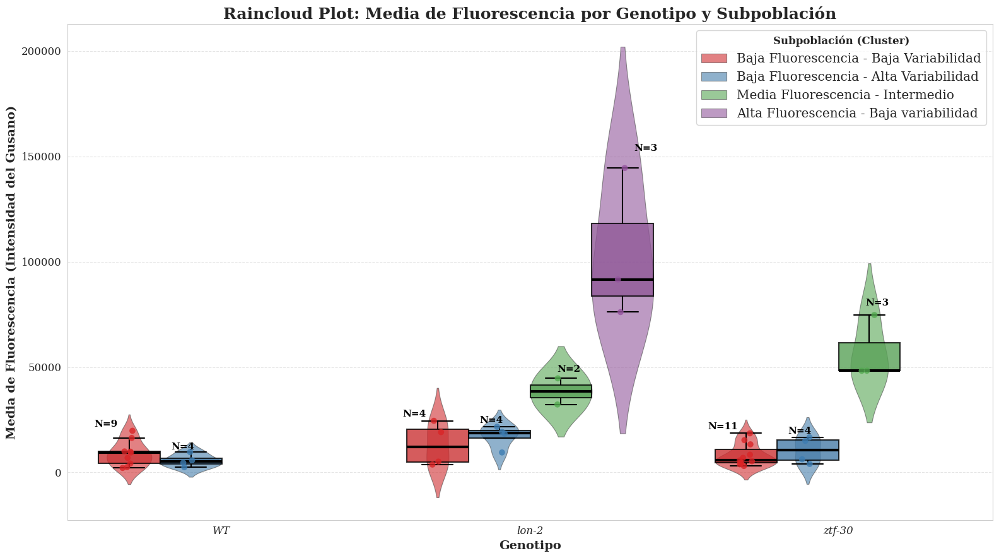

In [190]:


df = df_datos_combinado

# --- CONFIGURACIÓN DE ESTILO ---
# 1. Usar un estilo elegante de fondo (opcional, pero mejora la estética)
sns.set_style("whitegrid")
# 2. Configuración de fuente (usaremos 'serif' como ejemplo de fuente más elegante)
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.size'] = 12 # Ajuste el tamaño base de la fuente si lo desea

# --- 1. Calcular los conteos (N) por cada grupo ---
counts = df.groupby(['Genotipo', 'Etiqueta_Cluster']).size().reset_index(name='N')

# --- 2. Crear el gráfico ---
plt.figure(figsize=(16, 9))

# Definimos una paleta más oscura para los puntos (dots)
# Usaremos 'Set1_d' (darkened Set1) o simplemente definiremos una paleta oscura a partir de Set1
palette_base = sns.color_palette("Set1", n_colors=len(df['Etiqueta_Cluster'].unique()))
palette_dots = sns.color_palette("Set1", n_colors=len(df['Etiqueta_Cluster'].unique())).as_hex()
palette_dots = [sns.desaturate(c, 0.9) for c in palette_base] # Una opción para oscurecer: desaturar el color base

# A. VIOLIN PLOT
sns.violinplot(
    data=df,
    x='Genotipo',
    y='media',
    hue='Etiqueta_Cluster',
    split=False,
    inner=None,
    width=0.8,
    palette=palette_base, # Usamos la paleta base
    alpha=0.6,
    saturation=0.8,
    linewidth=0.8
)

# B. BOX PLOT
sns.boxplot(
    data=df,
    x='Genotipo',
    y='media',
    hue='Etiqueta_Cluster',
    palette=palette_base, # Usamos la paleta base
    width=0.8,
    boxprops={'zorder': 2, 'alpha': 0.8, 'edgecolor': 'black', 'linewidth': 1.5},
    medianprops={'color': 'black', 'linewidth': 3},
    whiskerprops={'color': 'black', 'linewidth': 1.5},
    capprops={'color': 'black', 'linewidth': 1.5},
    showfliers=False
)

# C. SCATTER/STRIP PLOT (Puntos más oscuros e intensos)
sns.stripplot(
    data=df,
    x='Genotipo',
    y='media',
    hue='Etiqueta_Cluster',
    dodge=True,
    palette=palette_dots, # <-- CLAVE: Usamos la paleta oscura
    s=7,
    alpha=0.8, # <-- CLAVE: Aumentamos la opacidad (intensidad)
    linewidth=0,
    jitter=0.1
)

# --- 3. Añadir el CONTEO (N) encima de cada grupo (con fuente elegante) ---
genotypes = df['Genotipo'].unique()
cluster_names = df['Etiqueta_Cluster'].unique()
n_clusters = len(cluster_names)
hue_shift = 0.25

for (genotipo, cluster), n_value in counts.set_index(['Genotipo', 'Etiqueta_Cluster'])['N'].items():
    if n_value > 0:
        genotype_index = list(genotypes).index(genotipo)
        cluster_index = list(cluster_names).index(cluster)
        shift = (cluster_index - (n_clusters - 1) / 2) * hue_shift
        
        max_y = df[(df['Genotipo'] == genotipo) & (df['Etiqueta_Cluster'] == cluster)]['media'].max()
        text_y = max_y * 1.05

        plt.text(
            genotype_index + shift,
            text_y,
            f'N={n_value}',
            ha='center',
            va='bottom',
            fontsize=11, # Ligeramente más grande
            fontweight='bold', # En negrita
            color='black' # Color negro para mayor contraste
        )

# --- 4. Etiquetas, Títulos y Leyenda (con estilo) ---
plt.title('Raincloud Plot: Media de Fluorescencia por Genotipo y Subpoblación', fontsize=18, fontweight='bold')
plt.xlabel('Genotipo', fontsize=14, fontweight='bold')
plt.ylabel('Media de Fluorescencia (Intensidad del Gusano)', fontsize=14, fontweight='bold')

# Estilo para las etiquetas del eje X (En itálica)
plt.xticks(fontstyle='italic')

# Limpiar la leyenda de entradas duplicadas
handles, labels = plt.gca().get_legend_handles_labels()
legend = plt.legend(
    handles[:n_clusters], 
    labels[:n_clusters], 
    title='Subpoblación (Cluster)', 
    loc='upper right', 
    frameon=True,
    fontsize='large'
)

# Estilo de la Leyenda: Poner el título en negrita
legend.get_title().set_fontweight('bold')

plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()